# Import Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

from dataprep.eda import create_report

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from imblearn.pipeline import Pipeline

from dataprep.eda import create_report

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


In [2]:
from scipy.stats import probplot
from matplotlib import pyplot

In [3]:
# Turn off scientific notation
pd.options.display.float_format = '{:.2f}'.format

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)

# Initial Settings

In [4]:
#predict = ['Cycle Total']
#scalers = ['NA', 'Standard']
#imputers = ['KNN']
#splitSizes = [0.30]
#models = ['KNN']
predict = ['Pedestrian Total', 'Cycle Total']
models = ['KNN', 'Ridge', 'RandomForest']
imputers = ['KNN', 'Pandas']
splitSizes = [0.50, 0.30, 0.10]
scalers = ['NA', 'Standard']

# Import Datasets

## Weather

In [5]:
# Import hourly weather data
hourlyWeather = pd.read_csv('hly175.csv', 
                parse_dates=['date'],
                usecols=['date','rain','temp','dewpt','vappr','rhum','msl'])

hourlyWeather.head(10)

,date,rain,temp,dewpt,vappr,rhum,msl
0,2015-01-01 00:00:00,0.00,9.30,6.70,9.80,83,1021.40
1,2015-01-01 01:00:00,0.00,9.10,5.70,9.20,79,1021.40
2,2015-01-01 02:00:00,0.00,9.50,5.40,9.00,75,1020.60
3,2015-01-01 03:00:00,0.00,10.10,5.60,9.10,73,1020.10
4,2015-01-01 04:00:00,0.00,10.30,6.40,9.60,76,1019.70
5,2015-01-01 05:00:00,0.00,10.60,6.40,9.60,75,1018.30
6,2015-01-01 06:00:00,0.00,10.90,5.80,9.20,70,1017.50
7,2015-01-01 07:00:00,0.00,10.90,6.10,9.40,72,1017.00
8,2015-01-01 08:00:00,0.10,11.30,6.30,9.50,71,1016.20
9,2015-01-01 09:00:00,0.40,11.80,8.00,10.70,77,1014.10


### Define Weather Columns

rain : Rain will be output in millimetres (mm).

temp : temprature in celsius

dewpt : dew point temprature: This is the temperature at which the air would become saturated. If it equals the actual temperature (TTT) we have 100% humidity so rain, mist, fog or low cloud.

vappr : water vapor for humidity

rhum : Relative humidity has a maximum value of 100 percent.

msl : mean sea level pressure (hPa). Pressure is given in units of hPa.

https://data.gov.ie/dataset/met-eireann-weather-forecast-api


## Pedestrian Counts

In [6]:
# Pedestrian Counts
# 2019 Counts
pedCount2019 = pd.read_excel('dcc-2019-pedestrian-footfall-count-jan-dec_14082020.xlsx')

# 2020 Counts
pedCount2020 = pd.read_csv('jan-dec-2020-ped-data.csv')

# 2021 Counts
pedCount2021 = pd.read_csv('2021-jan-dec-dcc-footfall.csv')

In [7]:
pedCount2019.head(10)

,Time,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2019-01-01 00:00:00,244,1914.00,20,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.00,1670.00,255.00,881.00,1988.00,140.00,NaN,NaN,NaN
1,2019-01-01 00:15:00,454,NaN,24,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,265.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-01 00:30:00,391,NaN,69,99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,117.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-01 00:45:00,415,NaN,50,61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-01 01:00:00,319,885.00,24,47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.00,767.00,209.00,723.00,1270.00,215.00,NaN,NaN,NaN
5,2019-01-01 01:15:00,366,NaN,26,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2019-01-01 01:30:00,275,NaN,23,47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2019-01-01 01:45:00,227,NaN,29,37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2019-01-01 02:00:00,296,984.00,7,23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.00,642.00,193.00,1010.00,1589.00,210.00,NaN,NaN,NaN
9,2019-01-01 02:15:00,241,NaN,15,27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
pedCount2020.head(10)

,Date & Time,Aston Quay,Bachelors Walk,Capel Street - Removed from site 20/10,College Green - Dame St Side,College Green @ Church Lane,"College Green, Bank Of Ireland",Dame Street (Counter Missing),Dawson Street Replacement,"Doilier Street, Burgh Quay",Grafton Street,Grafton Street / Nassau Street / Suffolk Street,Grafton Street @ CompuB,Henry Street,Liffey Street,Mary Street,O'Connell St Outside Clerys,O'Connell St Outside Pennys,"O'Connell St, Parnell St @ AIB",Talbot Street North,Talbot Street South,Westmoreland Street East,Westmoreland Street West
0,01-01-2020 00:00:00,1600.00,868.00,277.00,1797.00,1494.00,893.00,1090.00,18.00,994.00,1516.00,1238.00,3481.00,NaN,1180.00,60.00,2195.00,1662.00,821.00,109.00,1085.00,1577.00,2593.00
1,01-01-2020 01:00:00,858.00,727.00,214.00,594.00,676.00,1091.00,1148.00,7.00,745.00,1169.00,405.00,1870.00,NaN,1133.00,33.00,990.00,1160.00,469.00,53.00,1296.00,566.00,1917.00
2,01-01-2020 02:00:00,3499.00,930.00,219.00,429.00,523.00,1202.00,1052.00,15.00,710.00,1097.00,382.00,1626.00,NaN,898.00,51.00,856.00,1110.00,347.00,71.00,1848.00,474.00,1889.00
3,01-01-2020 03:00:00,1804.00,561.00,176.00,365.00,520.00,1115.00,899.00,8.00,1065.00,989.00,353.00,1280.00,NaN,595.00,44.00,842.00,1095.00,373.00,49.00,1783.00,410.00,2101.00
4,01-01-2020 04:00:00,2562.00,269.00,98.00,176.00,238.00,1140.00,373.00,9.00,768.00,708.00,136.00,824.00,NaN,219.00,25.00,351.00,666.00,209.00,40.00,1705.00,120.00,873.00
5,01-01-2020 05:00:00,883.00,103.00,55.00,45.00,83.00,1164.00,158.00,1.00,201.00,374.00,29.00,530.00,NaN,47.00,12.00,102.00,317.00,110.00,31.00,2073.00,41.00,464.00
6,01-01-2020 06:00:00,500.00,278.00,37.00,57.00,120.00,596.00,134.00,1.00,112.00,162.00,30.00,289.00,NaN,48.00,9.00,127.00,200.00,107.00,9.00,1288.00,43.00,241.00
7,01-01-2020 07:00:00,1342.00,419.00,18.00,54.00,104.00,377.00,92.00,1.00,167.00,113.00,37.00,319.00,NaN,26.00,9.00,158.00,191.00,73.00,21.00,1168.00,44.00,306.00
8,01-01-2020 08:00:00,1279.00,121.00,30.00,70.00,134.00,418.00,136.00,8.00,506.00,107.00,45.00,361.00,NaN,74.00,11.00,208.00,218.00,95.00,53.00,2090.00,55.00,354.00
9,01-01-2020 09:00:00,3300.00,191.00,45.00,157.00,188.00,481.00,168.00,11.00,850.00,266.00,65.00,612.00,NaN,110.00,17.00,338.00,311.00,179.00,51.00,1388.00,107.00,652.00


In [9]:
pedCount2021.head(10)

,Date and Time,Aston Quay/Fitzgeralds,Aston Quay/Fitzgeralds IN,Aston Quay/Fitzgeralds OUT,Bachelors walk/Bachelors way,Bachelors walk/Bachelors way IN,Bachelors walk/Bachelors way OUT,Baggot st lower/Wilton tce inbound,Baggot st lower/Wilton tce inbound Pedestrians IN,Baggot st lower/Wilton tce inbound Pedestrians OUT,Baggot st upper/Mespil rd/Bank,Baggot st upper/Mespil rd/Bank Pedestrians IN,Baggot st upper/Mespil rd/Bank Pedestrians OUT,Capel st/Mary street,Capel st/Mary street Pedestrian IN,Capel st/Mary street Pedestrian OUT,College Green/Bank Of Ireland,College Green/Bank Of Ireland IN,College Green/Bank Of Ireland OUT,College Green/Church Lane,College Green/Church Lane IN,College Green/Church Lane OUT,College st/Westmoreland st,College st/Westmoreland st IN,College st/Westmoreland st OUT,D'olier st/Burgh Quay,D'olier st/Burgh Quay IN,D'olier st/Burgh Quay OUT,Dame Street/Londis,Dame Street/Londis Pedestrian IN,Dame Street/Londis Pedestrian OUT,Dawson Street/Molesworth,Dawson Street/Molesworth IN,Dawson Street/Molesworth OUT,Grafton st/Monsoon,Grafton st/Monsoon Pedestrian IN,Grafton st/Monsoon Pedestrian OUT,Grafton Street / Nassau Street / Suffolk Street,Grafton Street / Nassau Street / Suffolk Street IN,Grafton Street / Nassau Street / Suffolk Street OUT,Grafton Street/CompuB,Grafton Street/CompuB IN,Grafton Street/CompuB OUT,Grand Canal st upp/Clanwilliam place,Grand Canal st upp/Clanwilliam place Pedestrians IN,Grand Canal st upp/Clanwilliam place Pedestrians OUT,Grand Canal st upp/Clanwilliam place/Google,Grand Canal st upp/Clanwilliam place/Google Pedestrians IN,Grand Canal st upp/Clanwilliam place/Google Pedestrians OUT,Henry Street/Coles Lane/Dunnes,Henry Street/Coles Lane/Dunnes Pedestrian IN,Henry Street/Coles Lane/Dunnes Pedestrian OUT,Liffey st/Halfpenny Bridge,Liffey st/Halfpenny Bridge IN,Liffey st/Halfpenny Bridge OUT,Mary st/Jervis st,Mary st/Jervis st IN,Mary st/Jervis st OUT,Newcomen Bridge/Charleville mall inbound,Newcomen Bridge/Charleville mall inbound Pedestrians IN,Newcomen Bridge/Charleville mall inbound Pedestrians OUT,Newcomen Bridge/Charleville mall outbound,Newcomen Bridge/Charleville mall outbound Pedestrians IN,Newcomen Bridge/Charleville mall outbound Pedestrians OUT,North Wall Quay/Samuel Beckett bridge East,North Wall Quay/Samuel Beckett bridge East Channel 1 IN,North Wall Quay/Samuel Beckett bridge East Channel 2 OUT,North Wall Quay/Samuel Beckett bridge West,North Wall Quay/Samuel Beckett bridge West Pedestrians IN,North Wall Quay/Samuel Beckett bridge West Pedestrians OUT,O'Connell St/Parnell St/AIB,O'Connell St/Parnell St/AIB IN,O'Connell St/Parnell St/AIB OUT,O'Connell St/Pennys Pedestrian,O'Connell St/Pennys IN,O'Connell St/Pennys OUT,O'Connell st/Princes st North,O'Connell st/Princes st North IN,O'Connell st/Princes st North OUT,Phibsborough Rd/Enniskerry Road,Phibsborough Rd/Enniskerry Road Pedestrians IN,Phibsborough Rd/Enniskerry Road Pedestrians OUT,Phibsborough Rd/Munster St,Phibsborough Rd/Munster St Peds IN,Phibsborough Rd/Munster St Peds OUT,Richmond st south/Portabello Harbour inbound,Richmond st south/Portabello Harbour inbound Pedestrians IN,Richmond st south/Portabello Harbour inbound Pedestrians OUT,Richmond st south/Portabello Harbour outbound,Richmond st south/Portabello Harbour outbound Pedestrians IN,Richmond st south/Portabello Harbour outbound Pedestrians OUT,Talbot st/Guineys,Talbot st/Guineys IN,Talbot st/Guineys OUT,Talbot st/Murrays Pharmacy,Talbot st/Murrays Pharmacy IN,Talbot st/Murrays Pharmacy OUT,Westmoreland Street East/Fleet street,Westmoreland Street East/Fleet street IN,Westmoreland Street East/Fleet street OUT,Westmoreland Street West/Carrolls,Westmoreland Street West/Carrolls IN,Westmoreland Street West/Carrolls OUT
0,01-01-2021 00:00:00,165.00,65.00,100.00,66.00,19.00,47.00,5.00,2.00,3.00,13.00,6.00,7.00,NaN,NaN,NaN,163.00,72.00,91.00,52.00,21.00,31.00,27.00,17.00,10.00,793.00,608.00,185.00,NaN,NaN,NaN,45.00,30.00,15.00,94.00,36.00,58.00,9.00,4.

## Dublin Bike Count

In [10]:
# Import 2019 data 
cycleCount2019 = pd.read_csv('popen-data-dublinkeddatacycle-counter-datajan-dec-2019-cycle.csv')

# Import 2020 data 
cycleCount2020 = pd.read_csv('jan-dec-2020-cycle-data.csv')

# Import 2021 data
cycleCount2021 = pd.read_csv('2021-dublin-city-cycle-counts-31122021.csv')

In [11]:
cycleCount2019.head(10)

,Date and Time,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
0,01-01-2019 00:00:00,12.00,4,16,1,5.00
1,01-01-2019 01:00:00,17.00,8,14,1,6.00
2,01-01-2019 02:00:00,18.00,9,9,2,2.00
3,01-01-2019 03:00:00,18.00,5,15,1,3.00
4,01-01-2019 04:00:00,12.00,3,8,1,5.00
5,01-01-2019 05:00:00,15.00,4,9,4,5.00
6,01-01-2019 06:00:00,9.00,12,9,6,6.00
7,01-01-2019 07:00:00,24.00,9,9,1,12.00
8,01-01-2019 08:00:00,28.00,11,11,0,12.00
9,01-01-2019 09:00:00,25.00,13,10,1,13.00


In [12]:
cycleCount2020.head(10)

,Date & Time,Charleville Mall,Charleville Mall Cyclist IN,Charleville Mall Cyclist OUT,Grove Road Totem,Grove Road Totem OUT,Grove Road Totem IN,Guild Street,Guild Street bikes IN-Towards Quays,Guild Street bikes OUT-Towards Drumcondra,North Strand Rd N/B,North Strand Rd S/B
0,01-01-2020 00:00:00,0.00,0.00,0.00,12.00,6.00,6.00,5.00,4.00,1.00,13.00,8.00
1,01-01-2020 01:00:00,1.00,1.00,0.00,13.00,5.00,8.00,4.00,0.00,4.00,10.00,2.00
2,01-01-2020 02:00:00,2.00,1.00,1.00,16.00,12.00,4.00,5.00,1.00,4.00,13.00,6.00
3,01-01-2020 03:00:00,3.00,2.00,1.00,15.00,7.00,8.00,2.00,2.00,0.00,13.00,5.00
4,01-01-2020 04:00:00,1.00,1.00,0.00,18.00,16.00,2.00,1.00,1.00,0.00,11.00,1.00
5,01-01-2020 05:00:00,1.00,0.00,1.00,14.00,9.00,5.00,3.00,2.00,1.00,8.00,2.00
6,01-01-2020 06:00:00,0.00,0.00,0.00,19.00,6.00,13.00,9.00,9.00,0.00,8.00,10.00
7,01-01-2020 07:00:00,0.00,0.00,0.00,18.00,4.00,14.00,15.00,12.00,3.00,8.00,9.00
8,01-01-2020 08:00:00,0.00,0.00,0.00,18.00,7.00,11.00,12.00,11.00,1.00,10.00,11.00
9,01-01-2020 09:00:00,1.00,0.00,1.00,26.00,3.00,23.00,10.00,9.00,1.00,6.00,14.00


In [13]:
cycleCount2021.head(10)

,Date & Time,Charleville Mall,Charleville Mall Cyclist IN,Charleville Mall Cyclist OUT,Clontarf - James Larkin Rd,Clontarf - James Larkin Rd Cyclist IN,Clontarf - James Larkin Rd Cyclist OUT,Clontarf - Pebble Beach Carpark,Clontarf - Pebble Beach Carpark Cyclist IN,Clontarf - Pebble Beach Carpark Cyclist OUT,Drumcondra Cyclists 1,Drumcondra Cyclists 1 Cyclist IN,Drumcondra Cyclists 1 Cyclist OUT,Drumcondra Cyclists 2,Drumcondra Cyclists 2 Cyclist IN,Drumcondra Cyclists 2 Cyclist OUT,Griffith Avenue (Clare Rd Side),Griffith Avenue (Clare Rd Side) Cyclist IN,Griffith Avenue (Clare Rd Side) Cyclist OUT,Griffith Avenue (Lane Side),Griffith Avenue (Lane Side) Cyclist IN,Griffith Avenue (Lane Side) Cyclist OUT,Grove Road Totem,Grove Road Totem OUT,Grove Road Totem IN,North Strand Rd N/B,North Strand Rd S/B,Richmond Street Cyclists 1,Richmond Street Cyclists 1 Cyclist IN,Richmond Street Cyclists 1 Cyclist OUT,Richmond Street Cyclists 2,Richmond Street Cyclists 2 Cyclist IN,Richmond Street Cyclists 2 Cyclist OUT
0,01-01-2021 00:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,3.00,0.00,3.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,4.00,1.00,2.00,0.00,6.00,0.00,6.00,3.00,0.00,3.00
1,01-01-2021 01:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,4.00,2.00,2.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00
2,01-01-2021 02:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,5.00,2.00,0.00,0.00,2.00,0.00,2.00,3.00,0.00,3.00
3,01-01-2021 03:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,3.00,2.00,0.00,0.00,1.00,0.00,1.00,3.00,0.00,3.00
4,01-01-2021 04:00:00,3.00,3.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,6.00,6.00,0.00,0.00,2.00,4.00,0.00,4.00,1.00,0.00,1.00
5,01-01-2021 05:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,2.00,0.00,2.00,0.00,0.00,0.00
6,01-01-2021 06:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,2.00,5.00,3.00,3.00,4.00,0.00,4.00,4.00,0.00,4.00
7,01-01-2021 07:00:00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,8.00,0.00,8.00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,15.00,4.00,11.00,5.00,7.00,6.00,0.00,6.00,9.00,0.00,9.00
8,01-01-2021 08:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,0.00,5.00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,16.00,5.00,11.00,7.00,7.00,4.00,0.00,4.00,4.00,0.00,4.00
9,01-01-2021 09:00:00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,12.00,0.00,12.00,6.00,6.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,26.00,8.00,18.00,4.00,5.00,6.00,0.00,6.00,8.00,0.00,8.00


# EDA

In this section I will run through the datasets and clean them.  Cleaning them involves making sure columns are named properly for later comparison.  Additionally verifying that the data is in the right data type.  This means casting datetime on my date time columnOnce cleaned I will do an info to verify

In [14]:
cycleCols = ['Grove Road Totem', 'North Strand Rd S/B',
       'North Strand Rd N/B', 'Charleville Mall', 'Guild Street']
pedCols = ["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Dawson Street Replacement',
       'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']
weatherCols = ['rain', 'temp', 'dewpt', 'vappr', 'rhum', 'msl']

In [15]:
class descriptive():      
    def allDescriptive(self, df, title):
        print('Percentiles in the ' + title +' dataset:')
        print(df.describe(percentiles=[.25,.5,.75,.90,.95,.99]), '\n')
        print('Zero Counts in the ' + title +' dataset Percentage:')
        print(((df == 0).astype(float).sum(axis=0) / len(df)) * 100, '\n')
        print('NaN values in the '+ title + ' dataset Percentage: ')
        print(df.isna().sum() / len(df) * 100)

## Weather

### Cleaning Weather Data

In [16]:
# Ensure data is in crolological order
hourlyWeather.sort_values('date',inplace=True)

hourlyWeather = hourlyWeather.astype({'rain': 'float', 'temp': 'float', 'dewpt': 'float',
             'vappr':'float', 'rhum':'float', 'msl':'float'})

hourlyWeather.reset_index(drop=True,inplace=True)

hourlyWeather

,date,rain,temp,dewpt,vappr,rhum,msl
0,2015-01-01 00:00:00,0.00,9.30,6.70,9.80,83.00,1021.40
1,2015-01-01 01:00:00,0.00,9.10,5.70,9.20,79.00,1021.40
2,2015-01-01 02:00:00,0.00,9.50,5.40,9.00,75.00,1020.60
3,2015-01-01 03:00:00,0.00,10.10,5.60,9.10,73.00,1020.10
4,2015-01-01 04:00:00,0.00,10.30,6.40,9.60,76.00,1019.70
...,...,...,...,...,...,...,...
62780,2022-02-28 20:00:00,0.00,2.90,0.90,6.50,86.00,1025.50
62781,2022-02-28 21:00:00,0.00,1.90,0.60,6.40,91.00,1026.30
62782,2022-02-28 22:00:00,0.00,0.80,-0.20,6.00,93.00,1027.20
62783,2022-02-28 23:00:00,0.00,0.70,0.00,6.10,94.00,1027.60


In [17]:
hourlyWeather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62785 entries, 0 to 62784
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    62785 non-null  datetime64[ns]
 1   rain    62785 non-null  float64       
 2   temp    62785 non-null  float64       
 3   dewpt   62785 non-null  float64       
 4   vappr   62785 non-null  float64       
 5   rhum    62785 non-null  float64       
 6   msl     62785 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 3.4 MB


### Descriptive Statistics

In [18]:
descriptive().allDescriptive(hourlyWeather, title='Weather')

Percentiles in the Weather dataset:
          rain     temp    dewpt    vappr     rhum      msl
count 62785.00 62785.00 62785.00 62785.00 62785.00 62785.00
mean      0.09    10.26     6.84    10.33    80.12  1013.85
std       0.39     5.17     4.54     3.19    12.96    12.31
min       0.00    -5.50    -9.80     2.90    21.00   961.80
25%       0.00     6.60     3.40     7.80    72.00  1006.30
50%       0.00    10.20     6.90    10.00    83.00  1015.10
75%       0.00    13.90    10.20    12.40    91.00  1022.30
90%       0.10    17.10    12.90    14.80    95.00  1028.70
95%       0.50    18.80    14.20    16.20    97.00  1032.60
99%       1.90    22.00    16.20    18.40    99.00  1038.20
max      17.40    28.30    19.50    22.60   100.00  1048.00 

Zero Counts in the Weather dataset Percentage:
date     0.00
rain    86.59
temp     0.12
dewpt    0.38
vappr    0.00
rhum     0.00
msl      0.00
dtype: float64 

NaN values in the Weather dataset Percentage: 
date    0.00
rain    0.00
temp   

### Descriptive Plots

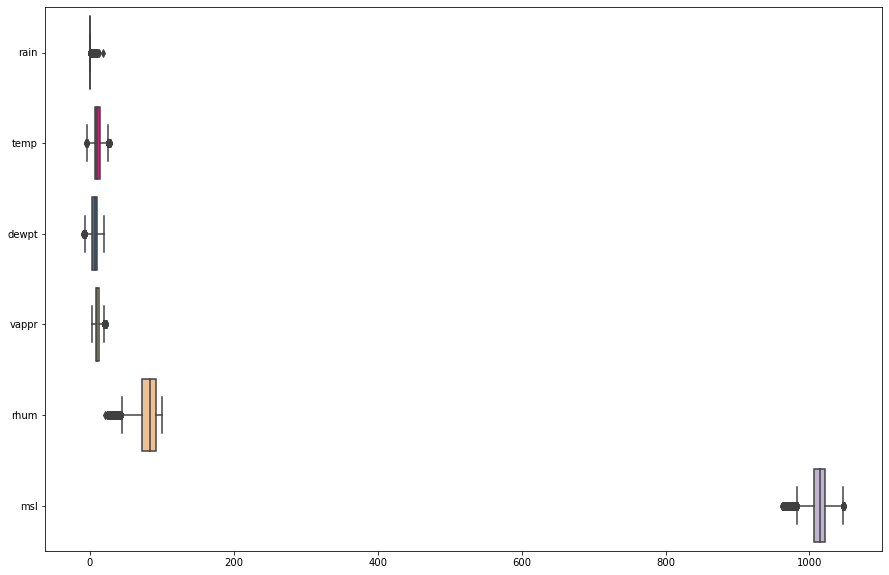

In [19]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=hourlyWeather, orient='h', palette='Accent_r')
plt.show()

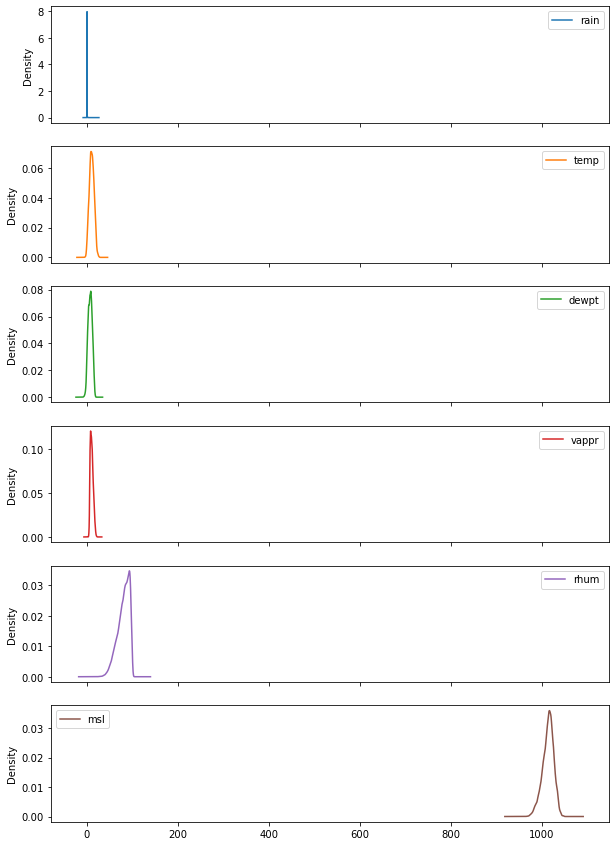

In [20]:
hourlyWeather[weatherCols].plot(kind='density', subplots=True, figsize=(10,15))
plt.show()

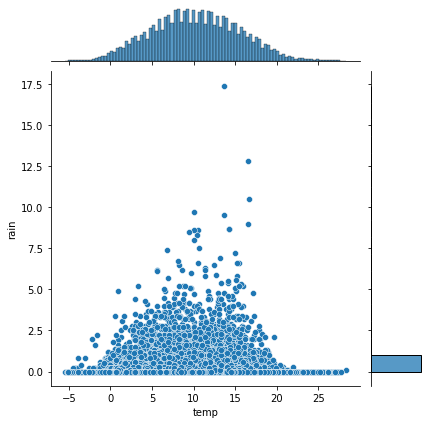

In [21]:
sns.jointplot(data=hourlyWeather[weatherCols], x='temp', y='rain');

### Weather Hour

In [22]:
hourlyWeatherEDA = hourlyWeather.copy()
hourlyWeatherEDA['Hour'] = hourlyWeatherEDA.date.dt.hour
hourlyWeatherEDA['Day of Week'] = hourlyWeatherEDA.date.dt.day_name()
hourlyWeatherEDA['Day'] = hourlyWeatherEDA.date.dt.dayofweek
hourlyWeatherEDA['Season'] = (hourlyWeatherEDA.date.dt.month%12 // 3  + 1)
hourlyWeatherEDA.sort_values('Day', inplace=True)
hourlyWeatherEDA.set_index('date', inplace=True)
hourlyWeatherEDA

,rain,temp,dewpt,vappr,rhum,msl,Hour,Day of Week,Day,Season
date,,,,,,,,,,
2017-09-11 00:00:00,0.10,11.90,10.80,12.90,92.00,983.90,0,Monday,0,4
2018-11-26 12:00:00,0.20,8.10,3.10,7.60,70.00,1015.60,12,Monday,0,4
2018-11-26 13:00:00,0.00,8.40,2.30,7.20,65.00,1015.70,13,Monday,0,4
2018-11-26 14:00:00,0.00,8.10,2.30,7.20,66.00,1015.40,14,Monday,0,4
2018-11-26 15:00:00,0.00,7.50,1.40,6.80,65.00,1015.10,15,Monday,0,4
...,...,...,...,...,...,...,...,...,...,...
2015-09-27 21:00:00,0.00,8.50,7.10,10.10,91.00,1035.20,21,Sunday,6,4
2015-09-27 20:00:00,0.00,9.40,7.80,10.60,89.00,1035.10,20,Sunday,6,4
2015-09-27 19:00:00,0.00,11.40,7.70,10.50,77.00,1034.50,19,Sunday,6,4


In [23]:
weatherHour = hourlyWeatherEDA.groupby(by='Hour').agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
weatherHour

,rain,temp,dewpt,vappr,rhum,msl
Hour,,,,,,
0,191.80,8.71,6.55,10.12,86.27,1014.13
1,187.00,8.54,6.50,10.08,86.90,1013.99
2,203.60,8.38,6.44,10.04,87.53,1013.85
3,234.90,8.22,6.37,9.99,88.00,1013.70
4,252.30,8.11,6.30,9.95,88.32,1013.57
5,267.80,8.08,6.32,9.96,88.55,1013.55
6,258.30,8.32,6.49,10.09,88.14,1013.63
7,252.30,8.87,6.69,10.24,86.28,1013.75
8,245.10,9.57,6.87,10.36,83.52,1013.91


In [24]:
weatherHour.describe()

,rain,temp,dewpt,vappr,rhum,msl
count,24.00,24.00,24.00,24.00,24.00,24.00
mean,222.41,10.26,6.84,10.33,80.12,1013.85
std,29.98,1.77,0.33,0.24,7.11,0.24
min,171.80,8.08,6.30,9.95,69.25,1013.48
25%,195.02,8.67,6.53,10.11,73.15,1013.64
50%,227.05,9.87,6.87,10.36,81.70,1013.84
75%,246.90,12.02,7.16,10.56,86.44,1014.05
max,267.80,12.94,7.26,10.63,88.55,1014.19


## Pedestrian

### Cleaning Pedestrian Data

In [25]:
# Pedestrian Counts
# 2019 Counts
pedCount2019 = pedCount2019.resample('60min', on='Time').sum()
pedCount2019.reset_index(inplace=True)
pedCount2019.rename(columns={'Time':'date'}, inplace=True)

# 2020 Counts
pedCount2020.rename(columns={'Date & Time':'date'}, inplace=True)

# 2021 Counts
pedCount2021.rename(columns={'Date and Time':'date'}, inplace=True)

In [26]:
# Convert object to datetime
pedCount2019.date = pd.to_datetime(pedCount2019.date)
pedCount2020.date = pd.to_datetime(pedCount2020.date)
pedCount2021.date = pd.to_datetime(pedCount2021.date)

In [27]:
# Merge two datasets into one
pedCount= pd.concat([pedCount2019, pedCount2020])
pedCount.reset_index(drop=True, inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Capel Street - Removed from site 20/10,Dame Street (Counter Missing)
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,255.00,881.00,1988.00,140.00,0.00,0.00,0.00,NaN,NaN
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,209.00,723.00,1270.00,215.00,0.00,0.00,0.00,NaN,NaN
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,193.00,1010.00,1589.00,210.00,0.00,0.00,0.00,NaN,NaN
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,178.00,772.00,1534.00,204.00,0.00,0.00,0.00,NaN,NaN
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,35.00,197.00,610.00,88.00,0.00,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,NaN,194.00,296.00,136.00,204.00,123.00,97.00,NaN,NaN
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,NaN,153.00,274.00,85.00,91.00,64.00,59.00,NaN,NaN
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,NaN,86.00,288.00,94.00,85.00,71.00,48.00,NaN,NaN
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,NaN,66.00,168.00,82.00,44.00,62.00,35.00,NaN,NaN


In [28]:
pedCount.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17544 entries, 0 to 17543
Data columns (total 26 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   date                                             17544 non-null  datetime64[ns]
 1   O'Connell St Outside Pennys                      17543 non-null  float64       
 2   O'Connell St Outside Clerys                      17543 non-null  float64       
 3   Mary Street                                      12191 non-null  float64       
 4   Capel Street                                     8760 non-null   float64       
 5   Aston Quay                                       17543 non-null  float64       
 6   Grafton Street @ CompuB                          17543 non-null  float64       
 7   Talbot Street North                              17543 non-null  float64       
 8   Doilier Street, Burgh Quay          

In [29]:
# Sort values to ensure date in time are in order
pedCount.sort_values('date',inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Capel Street - Removed from site 20/10,Dame Street (Counter Missing)
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,255.00,881.00,1988.00,140.00,0.00,0.00,0.00,NaN,NaN
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,209.00,723.00,1270.00,215.00,0.00,0.00,0.00,NaN,NaN
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,193.00,1010.00,1589.00,210.00,0.00,0.00,0.00,NaN,NaN
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,178.00,772.00,1534.00,204.00,0.00,0.00,0.00,NaN,NaN
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,35.00,197.00,610.00,88.00,0.00,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,NaN,194.00,296.00,136.00,204.00,123.00,97.00,NaN,NaN
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,NaN,153.00,274.00,85.00,91.00,64.00,59.00,NaN,NaN
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,NaN,86.00,288.00,94.00,85.00,71.00,48.00,NaN,NaN
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,NaN,66.00,168.00,82.00,44.00,62.00,35.00,NaN,NaN


In [30]:
# Drop the columns that no longer have counters and Mary Street that has loads of Na's almost all of 2020
pedCount.drop(columns=['Dame Street (Counter Missing)', 
                     'Capel Street - Removed from site 20/10',
                    'Dawson Street'],inplace=True)

In [31]:
# Had to rename columns to match previous years dataset
pedCount2021.rename(columns={'Date and Time':'date', 
                             "O\'Connell St/Pennys Pedestrian": "O'Connell St Outside Pennys",
                             "O\'Connell st/Princes st North": "O'Connell St Outside Clerys",
                             "Aston Quay/Fitzgeralds": 'Aston Quay',
                             'Grafton Street/CompuB': 'Grafton Street @ CompuB',
                             "Talbot st/Murrays Pharmacy": 'Talbot Street North',
                             "D\'olier st/Burgh Quay": 'Doilier Street, Burgh Quay',
                             "Dawson Street/Molesworth": 'Dawson Street Replacement',
                             "Talbot st/Guineys": 'Talbot Street South',
                             "O\'Connell St/Parnell St/AIB": "O'Connell St, Parnell St @ AIB",
                             "Grafton Street / Nassau Street / Suffolk Street": 'Grafton Street / Nassau Street / Suffolk Street',
                             "College Green/Bank Of Ireland": 'College Green, Bank Of Ireland',
                             "Henry Street/Coles Lane/Dunnes": 'Henry Street',
                             "Westmoreland Street East/Fleet street": 'Westmoreland Street East',
                             "Liffey st/Halfpenny Bridge": 'Liffey Street',
                             "Westmoreland Street West/Carrolls":'Westmoreland Street West',
                             "Grafton st/Monsoon":'Grafton Street', 
                             "Bachelors walk/Bachelors way":'Bachelors Walk',
                             "College Green/Church Lane":'College Green @ Church Lane',
                             "College st/Westmoreland st": 'College Green - Dame St Side',
                             "Capel st/Mary street": 'Capel Street',
                             'Dame Street/Londis': 'Dame Street',
                             'Mary st/Jervis st': 'Mary Street'
                            }, inplace=True)

# Filter out only columns from previous year's dataset
pedCount2021 = pedCount2021[pedCount.columns.values]
pedCount2021.sort_values('date',inplace=True)
pedCount2021.reset_index(drop=True, inplace=True)
pedCount2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00
1,2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00
2,2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00
3,2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00
4,2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00
8756,2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00
8757,2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00
8758,2021-12-31 22:00:00,NaN,385.00,109.00,1279.00,NaN,344.00,0.00,357.00,43.00,668.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00


### Descriptive Statistics

In [32]:
descriptive().allDescriptive(pedCount, title='2019 & 2020 Pedestrian Count')

Percentiles in the 2019 & 2020 Pedestrian Count dataset:
       O'Connell St Outside Pennys  O'Connell St Outside Clerys  Mary Street  \
count                     17543.00                     17543.00     12191.00   
mean                       1040.76                       753.10       205.05   
std                        1051.97                       667.38       241.40   
min                           0.00                         0.00         0.00   
25%                         160.00                       145.00        18.00   
50%                         630.00                       558.00        93.00   
75%                        1720.00                      1292.00       337.50   
90%                        2768.00                      1780.80       582.00   
95%                        3184.00                      2009.00       724.50   
99%                        3715.58                      2303.00       932.10   
max                        4809.00                      3798.00

In [33]:
descriptive().allDescriptive(pedCount2021, title='2021 Pedestrian Count')

Percentiles in the 2021 Pedestrian Count dataset:
       O'Connell St Outside Pennys  O'Connell St Outside Clerys  Mary Street  \
count                      3640.00                      8759.00      4488.00   
mean                        356.44                       508.99       823.64   
std                         354.11                       446.01       922.47   
min                           0.00                         0.00         0.00   
25%                          35.75                        92.50        74.00   
50%                         251.00                       416.00       379.00   
75%                         622.00                       817.00      1480.50   
90%                         840.10                      1183.20      2173.00   
95%                         959.05                      1368.10      2574.65   
99%                        1436.54                      1612.26      3537.39   
max                        2482.00                      2258.00      7

### Descriptive Plots

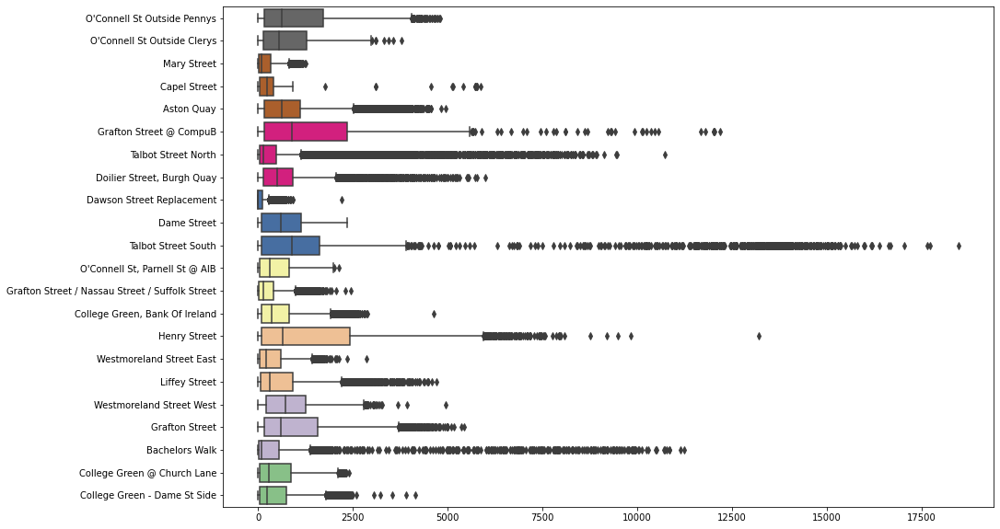

In [34]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=pedCount, orient='h', palette='Accent_r');

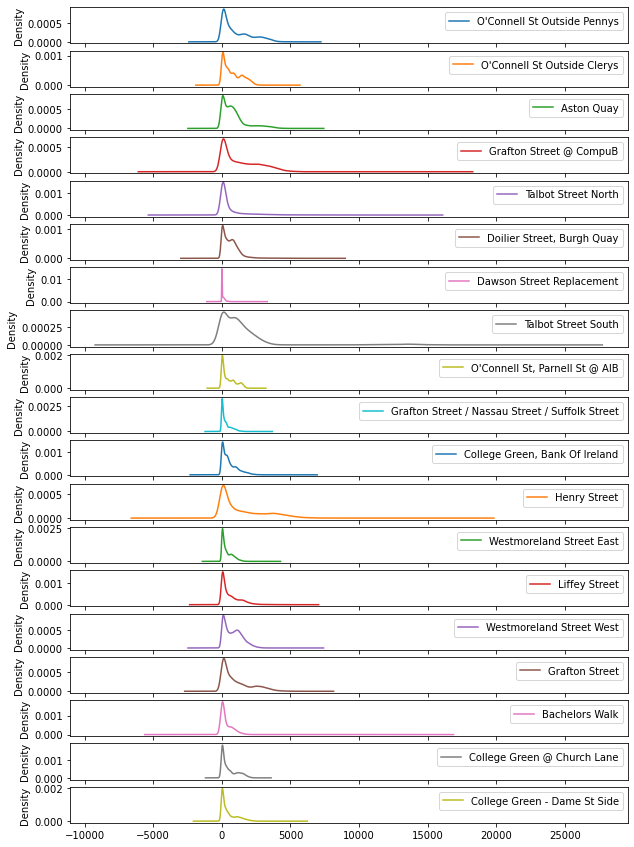

In [35]:
pedCount[pedCols].plot(kind='density', subplots=True, figsize=(10,15));

### Pedestrian Hour

In [36]:
pedCountEDA = pedCount.copy()
pedCountEDA['hour'] = pedCountEDA.date.dt.hour
pedCountEDA['Day of Week'] = pedCountEDA.date.dt.day_name()
pedCountEDA['Day'] = pedCountEDA.date.dt.dayofweek
pedCountEDA.set_index('date', inplace=True)
pedCountEDA.sort_values('Day',inplace=True)
pedCountEDA

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,hour,Day of Week,Day
date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-18 18:00:00,422.00,360.00,82.00,NaN,824.00,269.00,851.00,177.00,126.00,NaN,67.00,441.00,112.00,461.00,945.00,101.00,173.00,382.00,175.00,14.00,147.00,145.00,18,Monday,0
2019-04-01 10:00:00,2070.00,1366.00,339.00,327.00,750.00,1252.00,2408.00,801.00,0.00,1045.00,693.00,874.00,536.00,1186.00,2539.00,729.00,2250.00,1107.00,1546.00,962.00,1076.00,1021.00,10,Monday,0
2019-04-01 11:00:00,2361.00,1433.00,397.00,355.00,885.00,1483.00,1985.00,790.00,0.00,1056.00,806.00,1038.00,617.00,1332.00,3114.00,729.00,2256.00,893.00,2171.00,900.00,1069.00,900.00,11,Monday,0
2019-04-01 12:00:00,2881.00,1770.00,709.00,510.00,1111.00,2027.00,2954.00,1039.00,0.00,1241.00,1084.00,1245.00,702.00,1710.00,3920.00,874.00,1559.00,1217.00,3057.00,813.00,1542.00,1245.00,12,Monday,0
2019-04-01 13:00:00,3483.00,1987.00,891.00,664.00,1365.00,2825.00,5190.00,1237.00,0.00,1572.00,1505.00,1508.00,897.00,1890.00,4320.00,1203.00,2305.00,1585.00,3858.00,974.00,1804.00,1525.00,13,Monday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,3139.00,1733.00,717.00,457.00,1799.00,4174.00,179.00,667.00,0.00,1257.00,1531.00,1210.00,528.00,738.00,0.00,737.00,1582.00,2427.00,3183.00,1008.00,1278.00,838.00,17,Sunday,6
2019-11-17 16:00:00,3434.00,1674.00,845.00,509.00,2161.00,4197.00,207.00,595.00,0.00,1519.00,1783.00,1323.00,643.00,838.00,0.00,668.00,1851.00,2594.00,3755.00,919.00,1453.00,918.00,16,Sunday,6
2019-11-17 15:00:00,3524.00,1709.00,833.00,586.00,3061.00,3983.00,200.00,713.00,0.00,1438.00,1496.00,1389.00,712.00,843.00,0.00,699.00,2011.00,2686.00,3975.00,928.00,1411.00,1008.00,15,Sunday,6


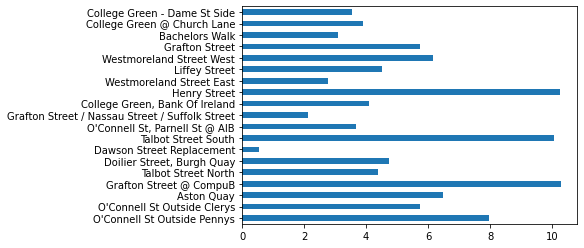

In [37]:
(pedCountEDA[pedCols].sum() / sum(pedCountEDA[pedCols].sum()) * 100).plot.barh();

In [38]:
pedHour = pedCountEDA.groupby(by='hour').mean()
pedHour.drop(columns=['Day'], inplace=True)
pedHour

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
hour,,,,,,,,,,,,,,,,,,,,,,
0,221.22,199.60,19.89,77.73,525.69,460.23,378.59,475.85,37.08,251.75,1738.78,99.73,73.26,267.71,167.42,153.46,207.92,401.19,325.42,159.04,131.28,105.45
1,151.04,111.82,11.21,65.64,382.57,308.92,232.68,358.00,25.53,207.81,1926.10,58.13,48.09,207.54,106.64,89.87,137.63,290.32,262.67,115.49,79.55,60.95
2,132.77,100.56,8.78,63.18,338.62,241.28,161.77,284.30,21.50,174.60,1802.84,45.33,38.84,174.33,83.74,66.10,109.88,256.35,245.84,81.01,58.94,47.50
3,121.22,77.21,8.35,80.86,258.44,218.19,114.59,196.21,18.29,158.47,1496.66,36.85,32.86,167.58,64.61,55.32,85.22,231.32,237.37,60.55,50.20,33.95
4,71.41,40.21,8.40,59.33,167.59,142.10,90.27,106.73,16.32,66.89,1314.50,25.99,15.48,116.93,59.55,31.32,30.71,96.10,130.16,36.91,21.83,17.12
5,74.82,67.60,12.47,42.33,157.43,159.81,93.40,109.30,21.17,58.51,1205.94,37.87,19.02,102.99,98.74,33.68,27.03,88.84,79.27,37.82,30.82,34.02
6,221.31,291.74,32.33,61.60,443.04,565.79,203.15,365.76,52.83,221.05,1388.92,109.23,74.65,216.70,280.99,102.34,94.06,304.93,188.08,155.70,215.30,146.50
7,402.88,514.95,57.43,91.25,887.29,1170.24,419.53,597.83,61.88,375.48,1799.67,194.64,153.41,303.28,520.80,202.22,205.40,514.86,409.15,342.63,311.19,349.81
8,828.64,848.74,139.60,212.26,964.81,1578.78,649.93,750.02,76.32,634.13,1901.73,391.42,321.05,486.84,983.54,401.24,422.14,811.79,909.27,594.47,594.89,774.43


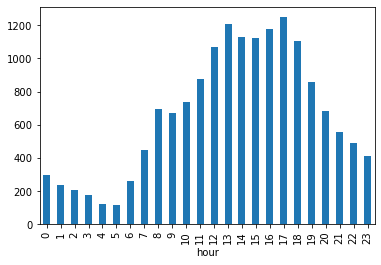

In [39]:
pedHour.mean(axis=1).plot.bar();

In [40]:
descriptive().allDescriptive(pedHour.mean(axis=1), title='Average Hourly Pedestrian Count')

Percentiles in the Average Hourly Pedestrian Count dataset:
count     24.00
mean     662.36
std      387.71
min      117.86
25%      286.03
50%      675.80
75%     1076.17
90%     1163.64
95%     1204.94
99%     1240.75
max     1250.01
dtype: float64 

Zero Counts in the Average Hourly Pedestrian Count dataset Percentage:
0.0 

NaN values in the Average Hourly Pedestrian Count dataset Percentage: 
0.0


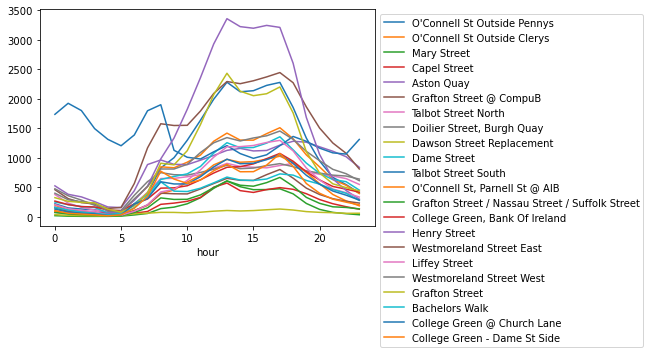

In [41]:
pedHour.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

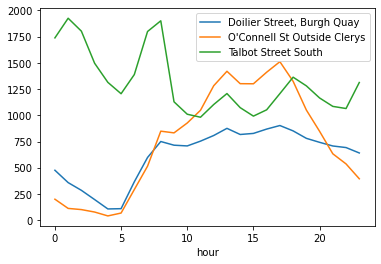

In [42]:
pedHour[['Doilier Street, Burgh Quay',"O'Connell St Outside Clerys",'Talbot Street South']].plot();

## Cycle

### Cleaning Cycle Dataset

In [43]:
# convert column name to date
cycleCount2019.rename(columns={'Date and Time':'date'}, inplace=True)
# convert column name to date
cycleCount2020.rename(columns={'Date & Time':'date'}, inplace=True)
# convert column name to date and change street name to match other datasets this column will be deleted
cycleCount2021.rename(columns={'Date & Time':'date',
                              'Drumcondra Cyclists 1' : 'Guild Street'}, inplace=True)

In [44]:
# Convert objects to datetime
cycleCount2019.date = pd.to_datetime(cycleCount2019.date)
cycleCount2020.date = pd.to_datetime(cycleCount2020.date)
cycleCount2021.date = pd.to_datetime(cycleCount2021.date)

# Keep 2019 columns only
cycleCount2020 = cycleCount2020[cycleCount2019.columns]

In [45]:
# Concat dataframes one on top of the other
cycleCount = pd.concat([cycleCount2019, cycleCount2020])

# Reset index
cycleCount.reset_index(drop=True, inplace=True)

# Make sure values are in cronological order
cycleCount.sort_values(by='date', inplace=True)

# Have to drop Guild Street to match 2021 dataset
cycleCount.drop(columns=['Guild Street'])

,date,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall
0,2019-01-01 00:00:00,12.00,4.00,16.00,1.00
1,2019-01-01 01:00:00,17.00,8.00,14.00,1.00
2,2019-01-01 02:00:00,18.00,9.00,9.00,2.00
3,2019-01-01 03:00:00,18.00,5.00,15.00,1.00
4,2019-01-01 04:00:00,12.00,3.00,8.00,1.00
...,...,...,...,...,...
17538,2020-12-31 19:00:00,55.00,9.00,5.00,2.00
17539,2020-12-31 20:00:00,34.00,2.00,11.00,0.00
17540,2020-12-31 21:00:00,22.00,2.00,11.00,3.00
17541,2020-12-31 22:00:00,24.00,7.00,9.00,3.00


In [46]:
cycleCount.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17543 entries, 0 to 17542
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 17543 non-null  datetime64[ns]
 1   Grove Road Totem     17526 non-null  float64       
 2   North Strand Rd S/B  17528 non-null  float64       
 3   North Strand Rd N/B  17528 non-null  float64       
 4   Charleville Mall     17528 non-null  float64       
 5   Guild Street         17527 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 959.4 KB


In [47]:
# Keep columns in previous year's dataset
cycleCount2021 = cycleCount2021[cycleCount.columns]
#cycleCount2021 = cycleCount.resample('60min', on='date').sum()
cycleCount2021.sort_values('date',inplace=True)
cycleCount2021.reset_index(drop=True, inplace=True)

In [48]:
cycleCount2021.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 8760 non-null   datetime64[ns]
 1   Grove Road Totem     8759 non-null   float64       
 2   North Strand Rd S/B  8749 non-null   float64       
 3   North Strand Rd N/B  8749 non-null   float64       
 4   Charleville Mall     8754 non-null   float64       
 5   Guild Street         8749 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 410.8 KB


### Descriptive Statistics

In [49]:
descriptive().allDescriptive(cycleCount, 'Cycle Statistics for 2019-2020 Datasets')

Percentiles in the Cycle Statistics for 2019-2020 Datasets dataset:
       Grove Road Totem  North Strand Rd S/B  North Strand Rd N/B  \
count          17526.00             17528.00             17528.00   
mean             115.98                42.48                49.56   
std              147.59                67.60                70.97   
min                0.00                 0.00                 0.00   
25%               25.00                 6.00                11.00   
50%               79.00                25.00                29.00   
75%              134.00                50.00                57.00   
90%              265.00                83.00               103.00   
95%              417.00               154.00               174.00   
99%              851.00               408.73               401.00   
max             1152.00               595.00               615.00   

       Charleville Mall  Guild Street  
count          17528.00      17527.00  
mean               6.01

In [50]:
descriptive().allDescriptive(cycleCount2021, 'Cycle Statistics for 2021 Dataset')

Percentiles in the Cycle Statistics for 2021 Dataset dataset:
       Grove Road Totem  North Strand Rd S/B  North Strand Rd N/B  \
count           8759.00              8749.00              8749.00   
mean              93.24                33.83                40.02   
std               80.63                35.18                42.55   
min                0.00                 0.00                 0.00   
25%               23.00                 6.00                 8.00   
50%               82.00                26.00                28.00   
75%              137.00                50.00                56.00   
90%              202.00                71.00                91.00   
95%              252.00                98.00               130.00   
99%              345.00               167.00               202.52   
max              486.00               319.00               285.00   

       Charleville Mall  Guild Street  
count           8754.00       8749.00  
mean               9.87      

### Decriptive Plots

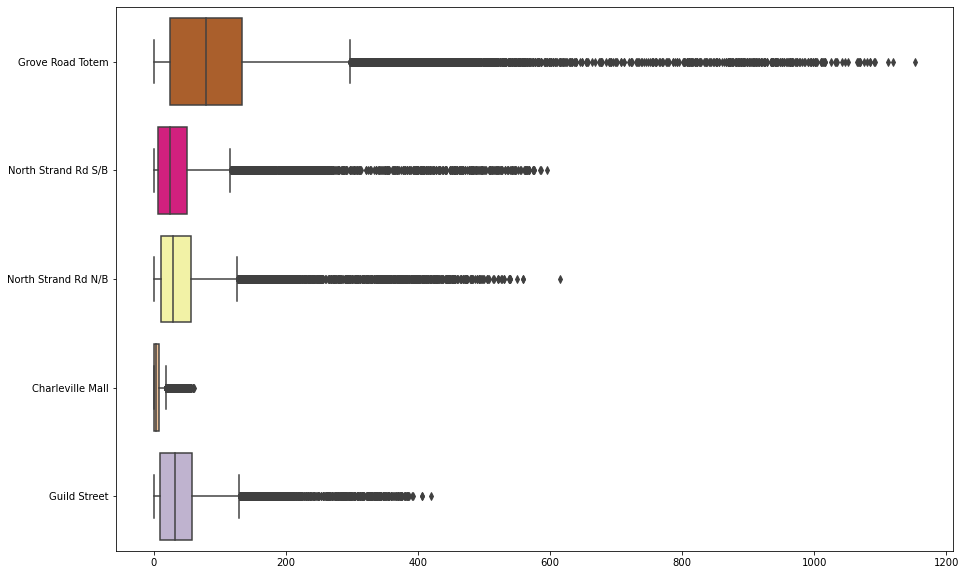

In [51]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=cycleCount, orient='h', palette='Accent_r');

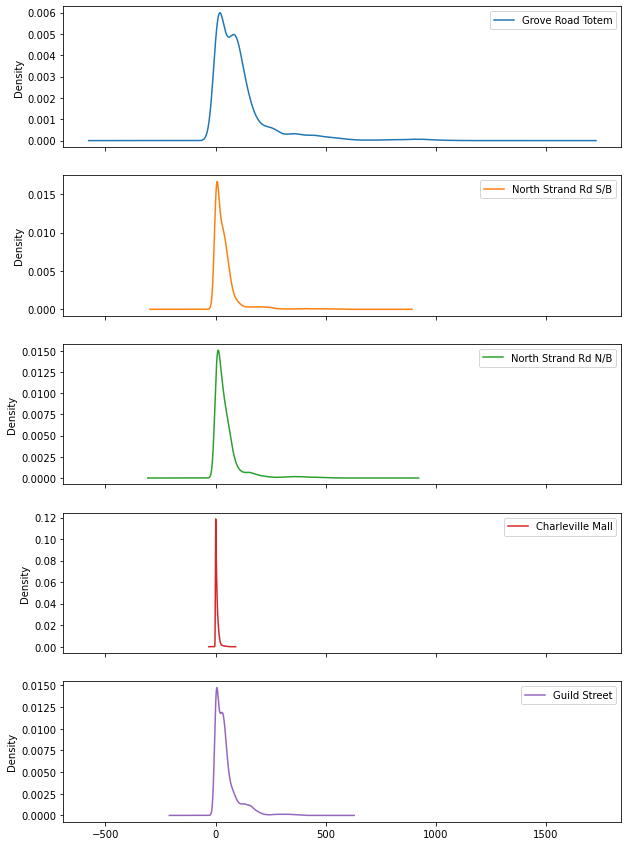

In [52]:
cycleCount[cycleCols].plot(kind='density', subplots=True, figsize=(10,15));

### Cycle Hour

In [53]:
cycleCountEDA = cycleCount.copy()
cycleCountEDA['hour'] = cycleCountEDA.date.dt.hour
cycleCountEDA['Day of Week'] = cycleCountEDA.date.dt.day_name()
cycleCountEDA['Day'] = cycleCountEDA.date.dt.dayofweek
cycleCountEDA.set_index('date', inplace=True)
cycleCountEDA.sort_values('Day',inplace=True)
cycleCountEDA

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,hour,Day of Week,Day
date,,,,,,,,
2020-05-18 18:00:00,165.00,58.00,91.00,2.00,42.00,18,Monday,0
2019-04-01 11:00:00,56.00,35.00,25.00,4.00,28.00,11,Monday,0
2019-04-01 12:00:00,80.00,30.00,31.00,7.00,36.00,12,Monday,0
2019-04-01 13:00:00,71.00,24.00,44.00,4.00,31.00,13,Monday,0
2019-04-01 14:00:00,90.00,33.00,65.00,5.00,35.00,14,Monday,0
...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,99.00,32.00,37.00,2.00,36.00,17,Sunday,6
2019-11-17 16:00:00,91.00,27.00,43.00,5.00,37.00,16,Sunday,6
2019-11-17 15:00:00,87.00,37.00,40.00,4.00,47.00,15,Sunday,6


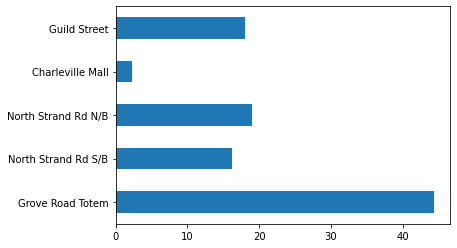

In [54]:
(cycleCountEDA[cycleCols].sum() / sum(cycleCountEDA[cycleCols].sum()) * 100).plot.barh();

In [55]:
cycleHour = cycleCountEDA.groupby(by='hour').mean()
cycleHour.drop(columns=['Day'], inplace=True)

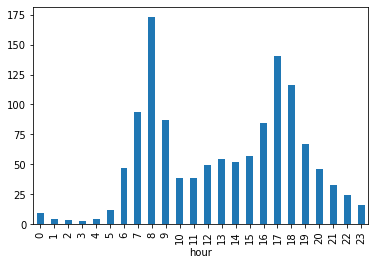

In [56]:
cycleHour.mean(axis=1).plot.bar();

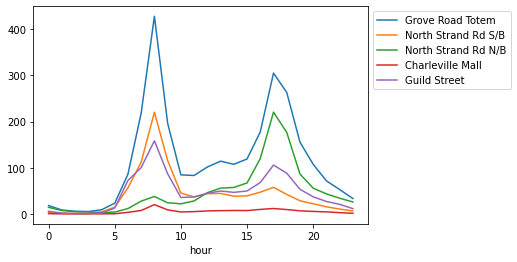

In [57]:
cycleHour.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

In [58]:
descriptive().allDescriptive(cycleHour.mean(axis=1), title='Average Hourly Cycle Count')

Percentiles in the Average Hourly Cycle Count dataset:
count    24.00
mean     52.20
std      44.98
min       2.87
25%      15.06
50%      46.23
75%      71.10
90%     109.47
95%     136.75
99%     165.58
max     173.12
dtype: float64 

Zero Counts in the Average Hourly Cycle Count dataset Percentage:
0.0 

NaN values in the Average Hourly Cycle Count dataset Percentage: 
0.0


## Correlations

### Weather

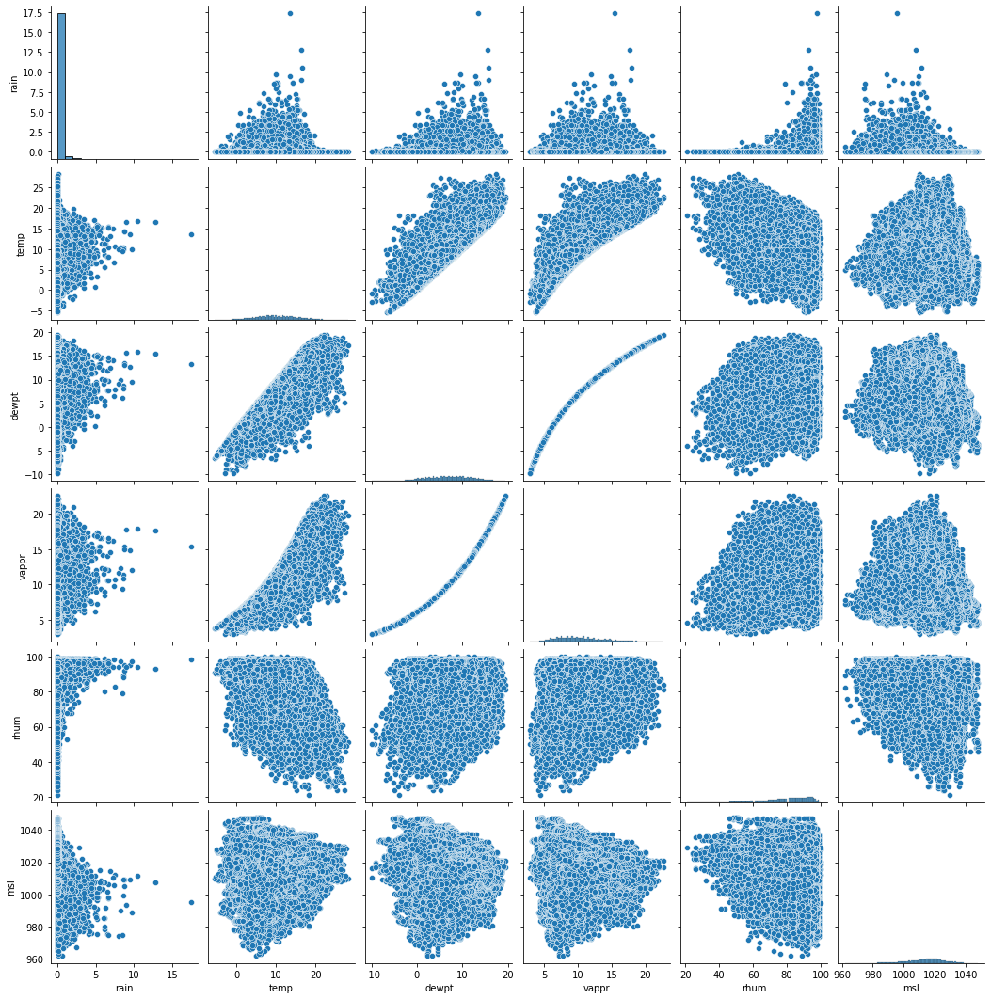

In [59]:
sns.pairplot(data=hourlyWeather);

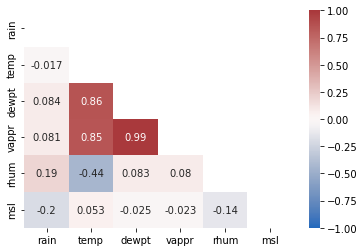

In [60]:
#https://datagy.io/python-correlation-matrix/
mask = np.triu(np.ones_like(hourlyWeather.corr(), dtype=bool))
sns.heatmap(hourlyWeather.corr(), annot=True, vmax=1, vmin=-1, center=0, mask = mask, cmap='vlag')
plt.show();

### Pedestrian

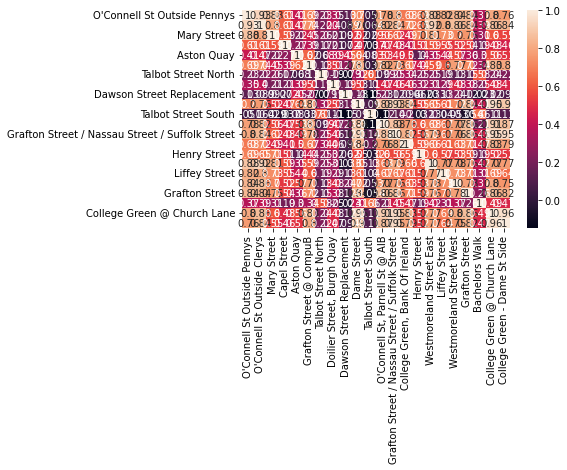

In [61]:
sns.heatmap(pedCount.corr(), annot=True);

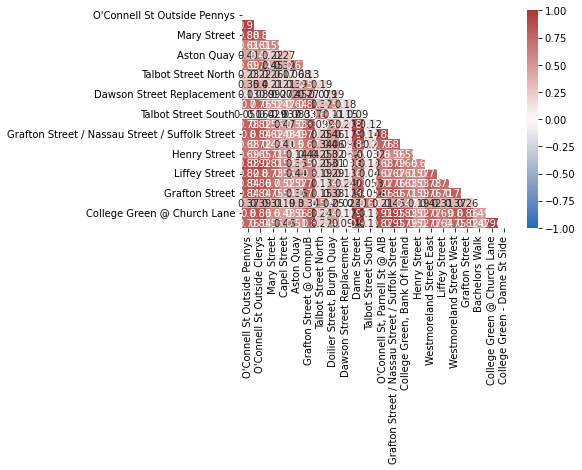

In [62]:
#https://datagy.io/python-correlation-matrix/
mask = np.triu(np.ones_like(pedCount.corr(), dtype=bool))
sns.heatmap(pedCount.corr(), annot=True, vmax=1, vmin=-1, center=0, mask = mask, cmap='vlag')
plt.show();

### Cycle

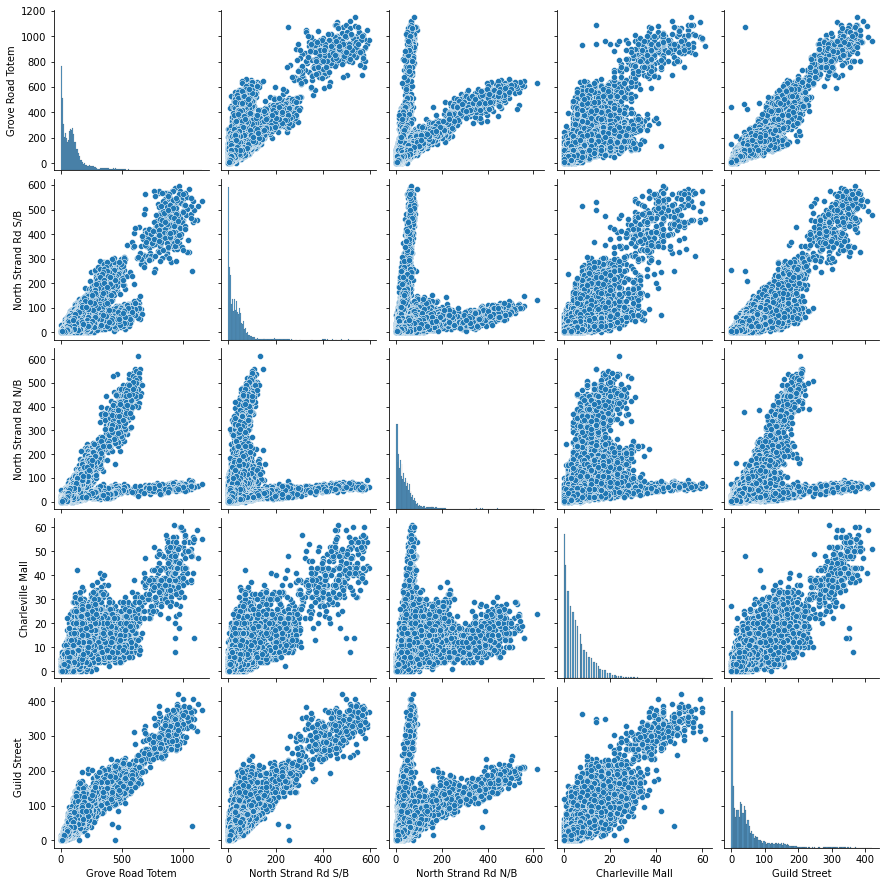

In [63]:
sns.pairplot(data=cycleCount);

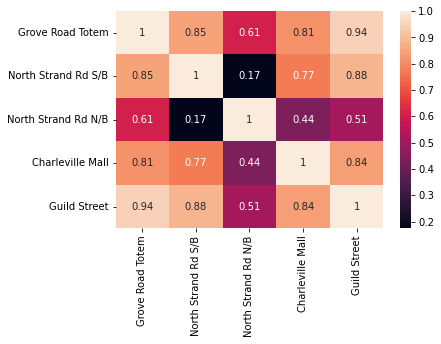

In [64]:
sns.heatmap(cycleCount.corr(), annot=True);

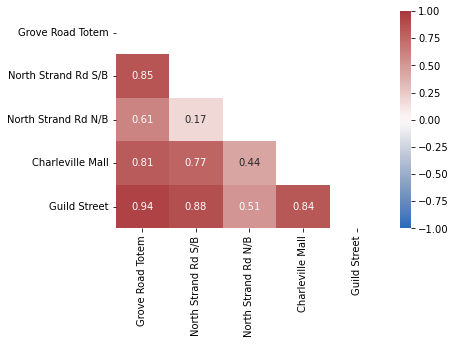

In [65]:
#https://datagy.io/python-correlation-matrix/
mask = np.triu(np.ones_like(cycleCount.corr(), dtype=bool))
sns.heatmap(cycleCount.corr(), annot=True, vmax=1, vmin=-1, center=0, mask = mask, cmap='vlag')
plt.show();

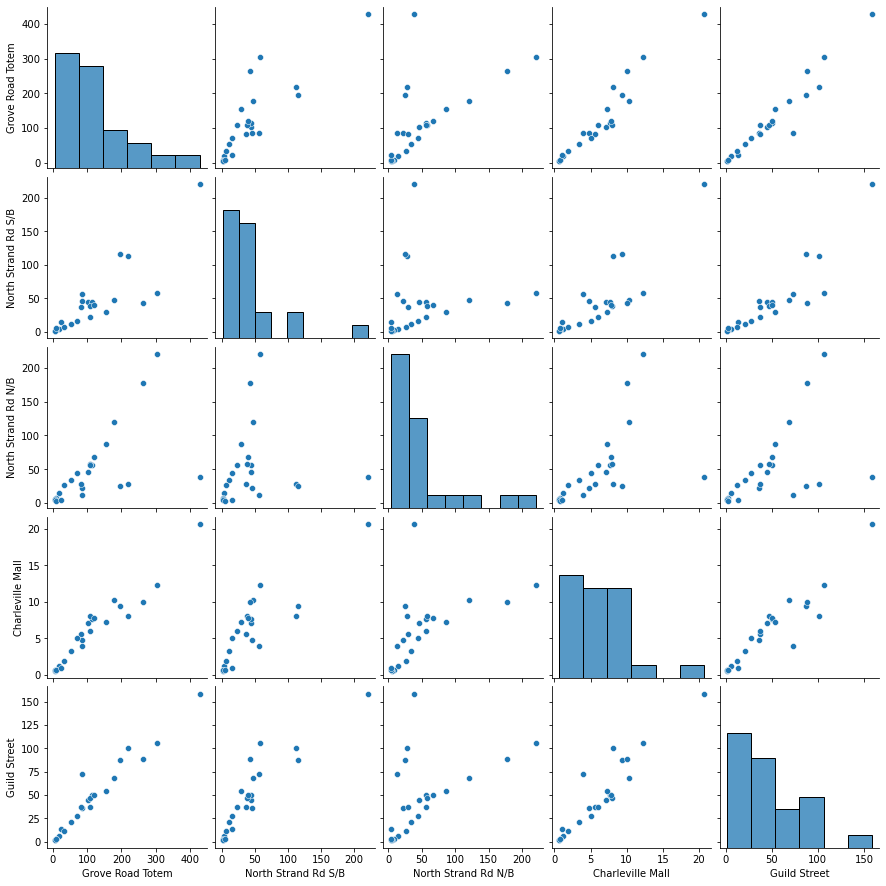

In [66]:
sns.pairplot(data=cycleHour);

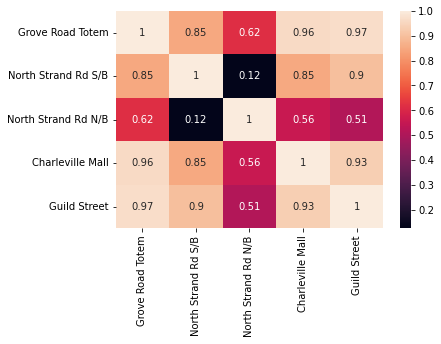

In [67]:
sns.heatmap(cycleHour.corr(), annot=True);

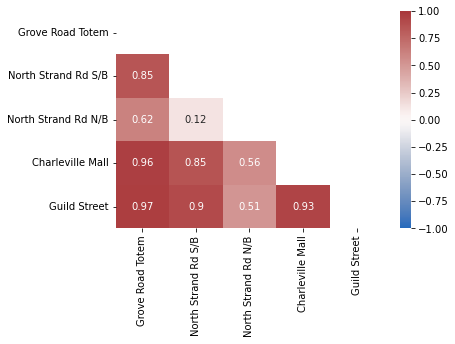

In [68]:
#https://datagy.io/python-correlation-matrix/
mask = np.triu(np.ones_like(cycleHour.corr(), dtype=bool))
sns.heatmap(cycleHour.corr(), annot=True, vmax=1, vmin=-1, center=0, mask = mask, cmap='vlag')
plt.show();

# Merge Datasets

In [69]:
# Training and testing dataset
df = pd.merge_asof(pedCount, cycleCount, on='date')
df = pd.merge_asof(df, hourlyWeather, on='date')
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80


In [70]:
descriptive().allDescriptive(df, title='All Data')

Percentiles in the All Data dataset:
       O'Connell St Outside Pennys  O'Connell St Outside Clerys  Mary Street  \
count                     17543.00                     17543.00     12191.00   
mean                       1040.76                       753.10       205.05   
std                        1051.97                       667.38       241.40   
min                           0.00                         0.00         0.00   
25%                         160.00                       145.00        18.00   
50%                         630.00                       558.00        93.00   
75%                        1720.00                      1292.00       337.50   
90%                        2768.00                      1780.80       582.00   
95%                        3184.00                      2009.00       724.50   
99%                        3715.58                      2303.00       932.10   
max                        4809.00                      3798.00      1263.00   

  

In [71]:
# Validation Dataset
df2021 = pd.merge_asof(pedCount2021, cycleCount2021, on='date')
df2021 = pd.merge_asof(df2021, hourlyWeather, on='date')
df2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90
1,2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40
2,2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80
3,2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30
4,2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40
8756,2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00
8757,2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40
8758,2021-12-31 22:00:00,NaN,385.00,109.00,1279.00,NaN,344.00,0.00,357.00,43.00,668.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00,19.00,2.00,11.00,3.00,0.00,0.00,14.40,11.40,13.50,82.00,1009.80


In [72]:
df2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 34 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   date                                             8760 non-null   datetime64[ns]
 1   O'Connell St Outside Pennys                      3640 non-null   float64       
 2   O'Connell St Outside Clerys                      8759 non-null   float64       
 3   Mary Street                                      4488 non-null   float64       
 4   Capel Street                                     4488 non-null   float64       
 5   Aston Quay                                       2796 non-null   float64       
 6   Grafton Street @ CompuB                          8732 non-null   float64       
 7   Talbot Street North                              8352 non-null   float64       
 8   Doilier Street, Burgh Quay            

In [73]:
descriptive().allDescriptive(df2021, title='2021 All Data')

Percentiles in the 2021 All Data dataset:
       O'Connell St Outside Pennys  O'Connell St Outside Clerys  Mary Street  \
count                      3640.00                      8759.00      4488.00   
mean                        356.44                       508.99       823.64   
std                         354.11                       446.01       922.47   
min                           0.00                         0.00         0.00   
25%                          35.75                        92.50        74.00   
50%                         251.00                       416.00       379.00   
75%                         622.00                       817.00      1480.50   
90%                         840.10                      1183.20      2173.00   
95%                         959.05                      1368.10      2574.65   
99%                        1436.54                      1612.26      3537.39   
max                        2482.00                      2258.00      7303.00  

# Feature Engineering

## Add Day of Week and Hour of Day

In [74]:
df['Day of Week'] = df.date.dt.dayofweek
df2021['Day of Week'] = df2021.date.dt.dayofweek
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3


In [75]:
df['Hour'] = df.date.dt.hour
df2021['Hour'] = df2021.date.dt.hour
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3,22


## Add Seasons

In [76]:
df['Season'] = (df.date.dt.month%12 // 3  + 1)
df2021['Season'] = (df2021.date.dt.month%12 // 3  + 1)
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,1
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,1
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,1
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3,22,1


## Total Counts

In [77]:
df['Cycle Total'] = df[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df['Pedestrian Total'] = df[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df['Total'] = df['Cycle Total'] + df['Pedestrian Total']
df.set_index('date', inplace=True)
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1,26.00,4896.00,4922.00
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1,29.00,3154.00,3183.00
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1,22.00,3544.00,3566.00
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1,24.00,3336.00,3360.00
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1,17.00,1561.00,1578.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,1,42.00,4694.00,4736.00
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,1,26.00,3499.00,3525.00
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,1,20.00,2704.00,2724.00


In [78]:
df2021['Cycle Total'] = df2021[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df2021['Pedestrian Total'] = df2021[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df2021['Total'] = df2021['Cycle Total'] + df2021['Pedestrian Total']
df2021.set_index('date', inplace=True)

df2021

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90,4,0,1,5.00,1583.00,1588.00
2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40,4,1,1,3.00,1584.00,1587.00
2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80,4,2,1,1.00,2257.00,2258.00
2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30,4,3,1,1.00,3171.00,3172.00
2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60,4,4,1,7.00,3807.00,3814.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40,4,19,1,51.00,4770.00,4821.00
2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00,4,20,1,47.00,4744.00,4791.00
2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40,4,21,1,45.00,3581.00,3626.00


## Add Moving Average

In [79]:
rollHours = 12
df[str(rollHours) + ' Hour Cycle Moving Average'] = df['Cycle Total'].rolling(rollHours).mean()
df[str(rollHours) + ' Hour Pedestrian Moving Average'] = df['Pedestrian Total'].rolling(rollHours).mean()
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1,26.00,4896.00,4922.00,NaN,NaN
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1,29.00,3154.00,3183.00,NaN,NaN
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1,22.00,3544.00,3566.00,NaN,NaN
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1,24.00,3336.00,3360.00,NaN,NaN
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1,17.00,1561.00,1578.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,1,42.00,4694.00,4736.00,65.42,6893.50
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,1,26.00,3499.00,3525.00,63.58,6955.08
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,1,20.00,2704.00,2724.00,62.83,6937.33


In [80]:
rollHours = 12
df2021[str(rollHours) + ' Hour Cycle Moving Average'] = df2021['Cycle Total'].rolling(rollHours).mean()
df2021[str(rollHours) + ' Hour Pedestrian Moving Average'] = df2021['Pedestrian Total'].rolling(rollHours).mean()
df2021

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90,4,0,1,5.00,1583.00,1588.00,NaN,NaN
2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40,4,1,1,3.00,1584.00,1587.00,NaN,NaN
2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80,4,2,1,1.00,2257.00,2258.00,NaN,NaN
2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30,4,3,1,1.00,3171.00,3172.00,NaN,NaN
2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60,4,4,1,7.00,3807.00,3814.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40,4,19,1,51.00,4770.00,4821.00,72.92,7661.50
2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00,4,20,1,47.00,4744.00,4791.00,72.92,7788.58
2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40,4,21,1,45.00,3581.00,3626.00,73.58,7690.08


## Descriptive Statistics

In [81]:
descriptive().allDescriptive(df, title='2019 & 2020 Pedestrian Count')

Percentiles in the 2019 & 2020 Pedestrian Count dataset:
       O'Connell St Outside Pennys  O'Connell St Outside Clerys  Mary Street  \
count                     17543.00                     17543.00     12191.00   
mean                       1040.76                       753.10       205.05   
std                        1051.97                       667.38       241.40   
min                           0.00                         0.00         0.00   
25%                         160.00                       145.00        18.00   
50%                         630.00                       558.00        93.00   
75%                        1720.00                      1292.00       337.50   
90%                        2768.00                      1780.80       582.00   
95%                        3184.00                      2009.00       724.50   
99%                        3715.58                      2303.00       932.10   
max                        4809.00                      3798.00

## Descriptive Plots

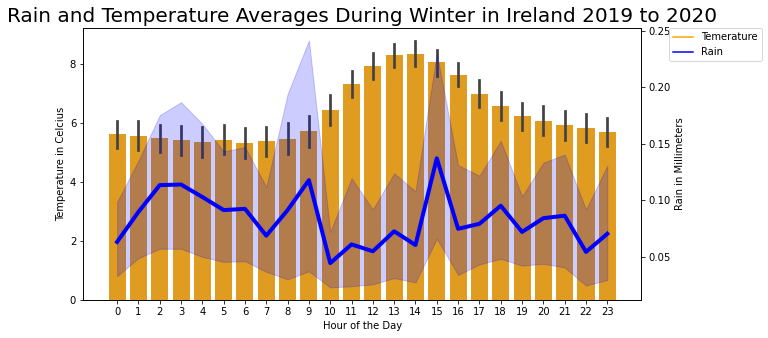

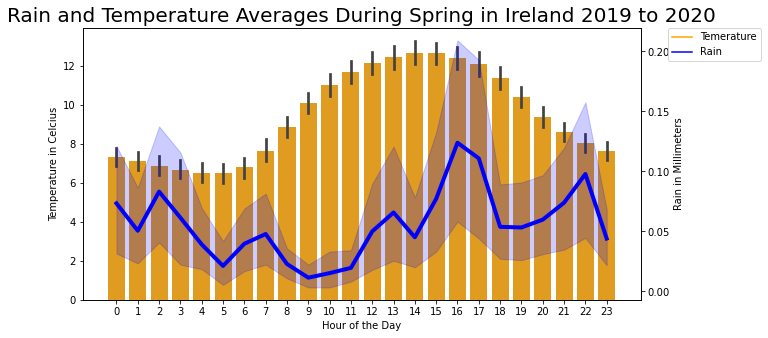

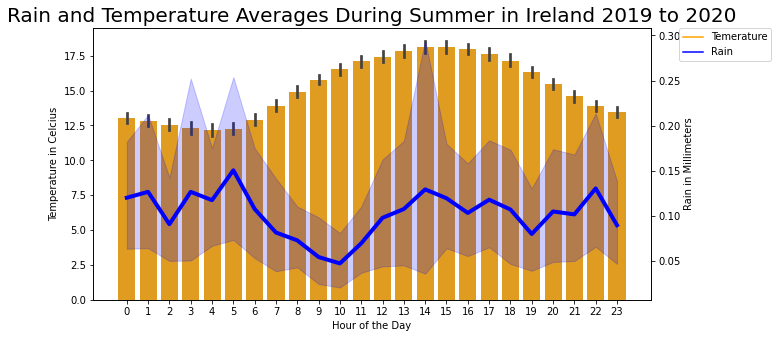

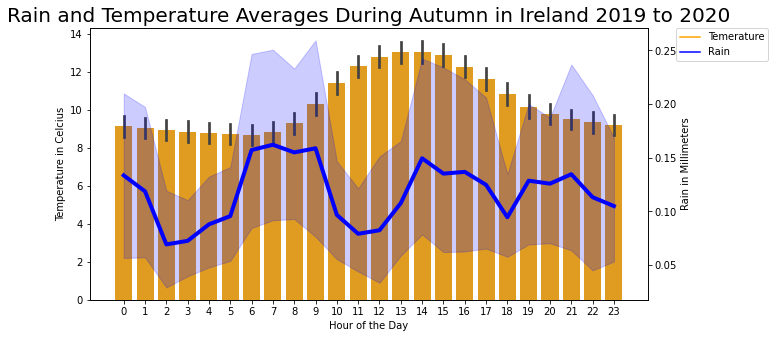

In [82]:
seasons = ['Winter', 'Spring', 'Summer', 'Autumn']
#https://stackoverflow.com/questions/47591650/second-y-axis-time-series-seaborn
from matplotlib.lines import Line2D

for i in range(len(seasons)):
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1 = sns.barplot(x='Hour', y='temp', 
        data= df[['temp','Hour']][df.Season == i+1], color='orange')
    ax1.set(xlabel='Hour of the Day', ylabel='Temperature in Celcius')
    ax1.grid(False)
    ax2 = ax1.twinx()
    sns.lineplot(x='Hour', y='rain', 
        data=df[['rain','Hour']][df.Season == i+1], ax=ax2,
                linewidth=4, color='blue')
    # https://www.programcreek.com/python/example/96215/seaborn.set
    ax2.set(ylabel='Rain in Millimeters')
    plt.title(label= 'Rain and Temperature Averages During '+ seasons[i] +' in Ireland 2019 to 2020', 
              fontsize=20)
    plt.legend(handles=[Line2D([], [], color="orange", label='Temerature'), 
                        Line2D([], [], color="blue", label='Rain')], fontsize=10,
              bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    plt.show();

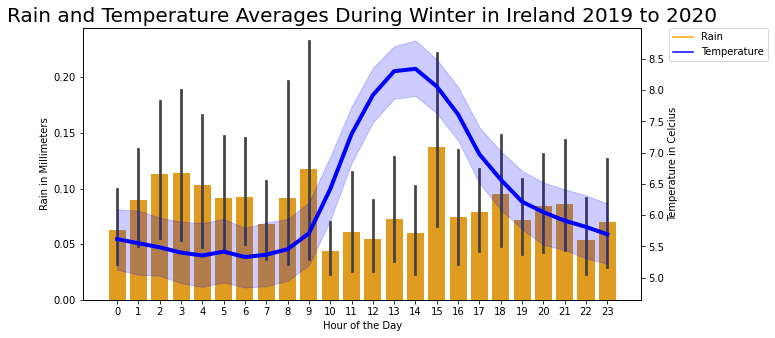

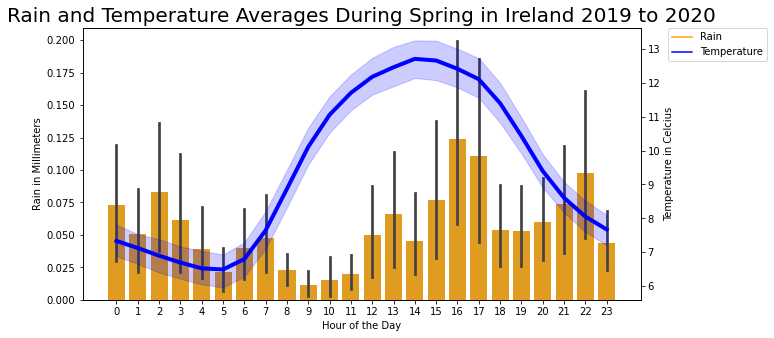

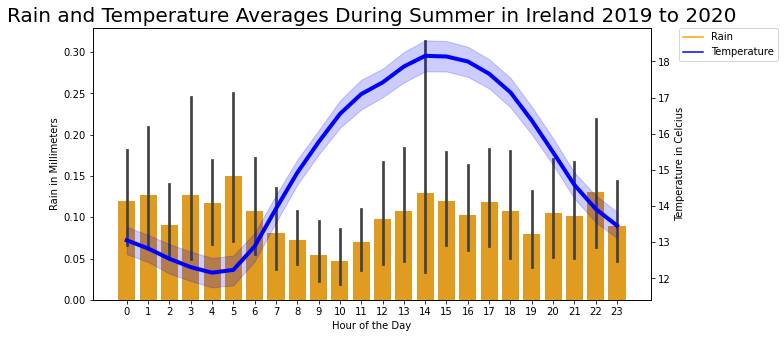

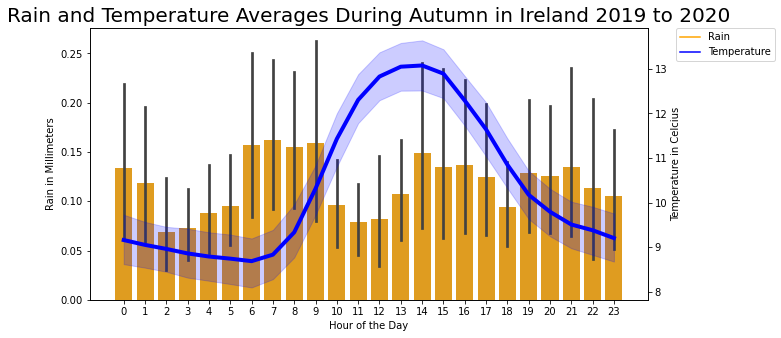

In [83]:
seasons = ['Winter', 'Spring', 'Summer', 'Autumn']
#https://stackoverflow.com/questions/47591650/second-y-axis-time-series-seaborn
from matplotlib.lines import Line2D

for i in range(len(seasons)):
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1 = sns.barplot(x='Hour', y='rain', 
        data= df[['rain','Hour']][df.Season == i+1], color='orange')
    ax1.set(xlabel='Hour of the Day', ylabel='Rain in Millimeters')
    ax1.grid(False)
    ax2 = ax1.twinx()
    sns.lineplot(x='Hour', y='temp', 
        data=df[['temp','Hour']][df.Season == i+1], ax=ax2,
                linewidth=4, color='blue')
    # https://www.programcreek.com/python/example/96215/seaborn.set
    ax2.set(ylabel='Temperature in Celcius')
    plt.title(label= 'Rain and Temperature Averages During '+ seasons[i] +' in Ireland 2019 to 2020', 
              fontsize=20)
    plt.legend(handles=[Line2D([], [], color="orange", label='Rain'), 
                        Line2D([], [], color="blue", label='Temperature')], fontsize=10,
              bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    plt.show();

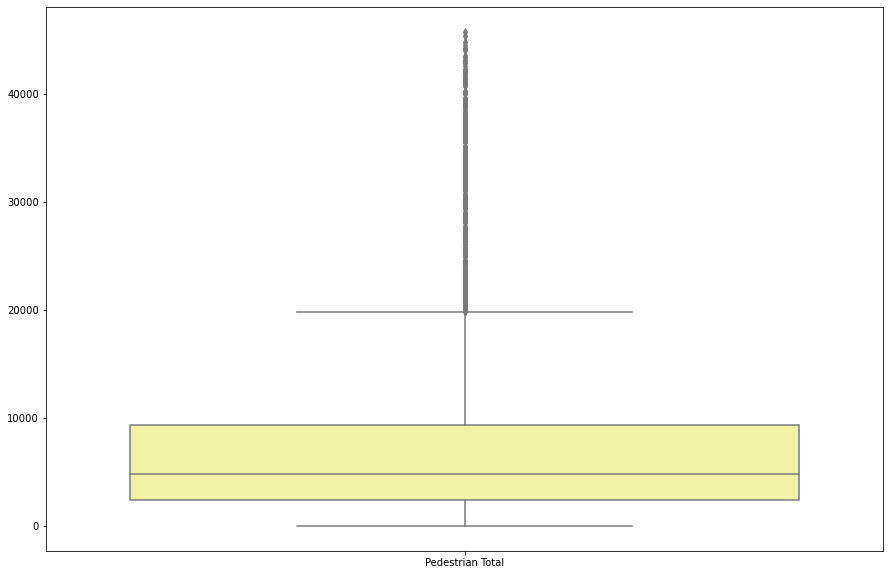

In [84]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=df[['Pedestrian Total']], palette='Accent_r');

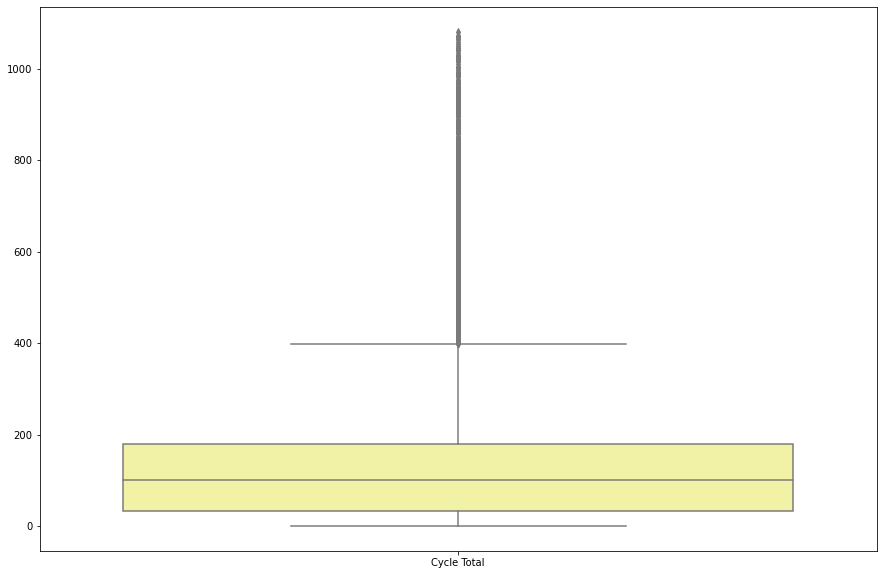

In [85]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=df[['Cycle Total']], palette='Accent_r');

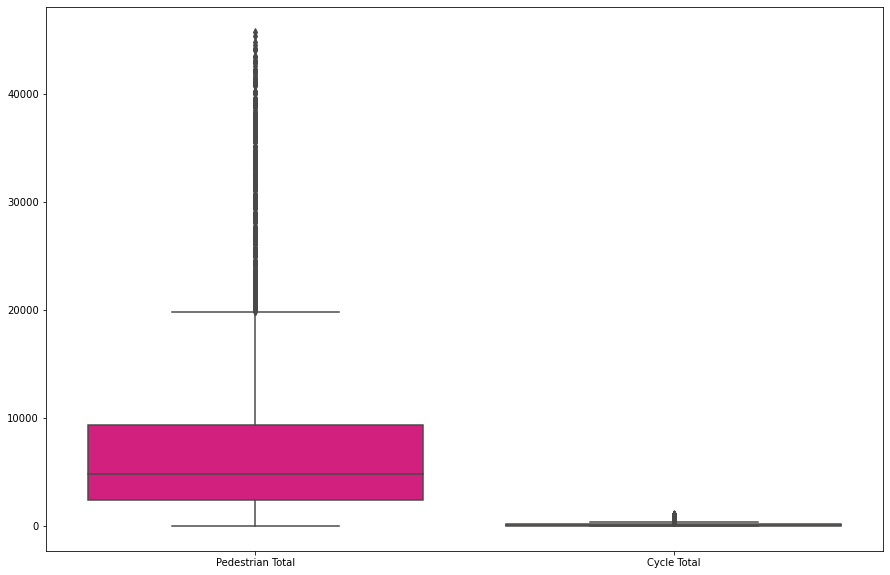

In [86]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=df[['Pedestrian Total','Cycle Total']], palette='Accent_r');

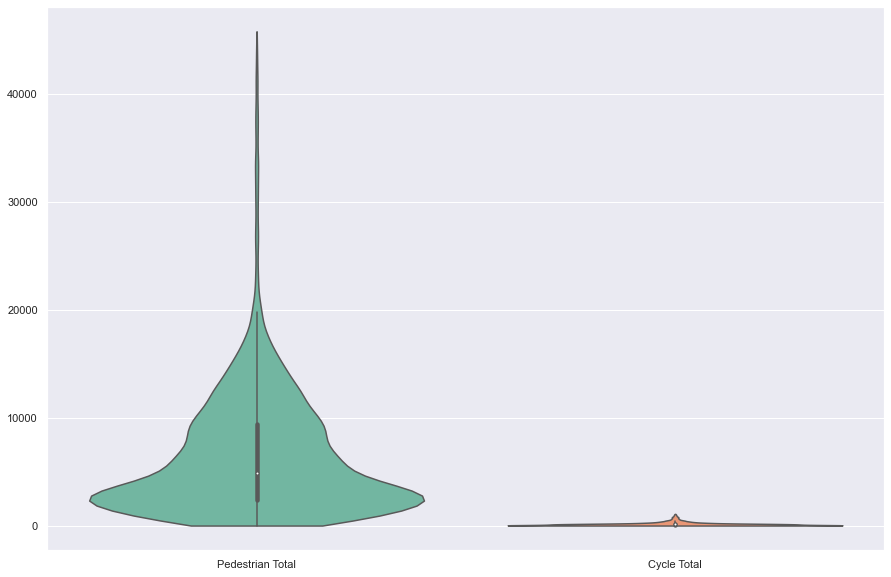

In [87]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=df[['Pedestrian Total','Cycle Total']], scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

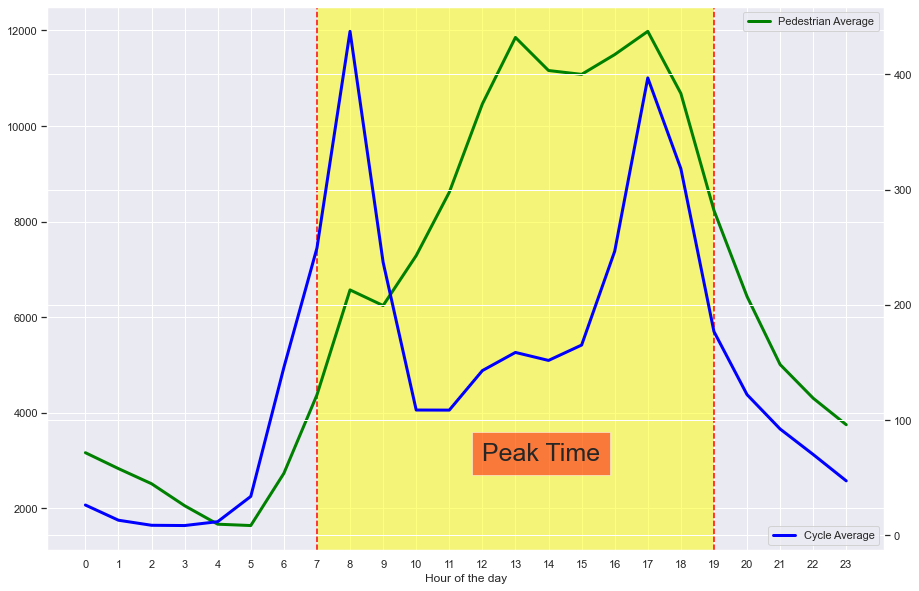

In [88]:
#https://www.statology.org/matplotlib-vertical-line/
# https://stackoverflow.com/questions/3681872/shading-an-area-between-two-points-in-a-matplotlib-plot
#https://matplotlib.org/stable/tutorials/text/text_intro.html

fig, ax1 = plt.subplots(figsize=(15,10))
plt.axvline(x=7, color='red', linestyle='--')
plt.axvline(x=19, color='red', linestyle='--')
plt.axvspan(7, 19, color='yellow', alpha=0.5, lw=0)
ax1.text(12,3000, 'Peak Time', bbox={'facecolor': 'red', 'alpha':0.5, 'pad':10}, fontsize=25)

# First plot
plt.plot(df[['Pedestrian Total','Hour']].groupby(by='Hour').mean(), label='Pedestrian Average', lw=3.0, color='green')
plt.xticks(list(df.Hour.unique()))

# Second plot
plt.legend(loc=0)
plt.xlabel('Hour of the day')
ax2 = ax1.twinx()
plt.plot(df[['Cycle Total','Hour']].groupby(by='Hour').mean(), label='Cycle Average', lw=3.0, color='blue')
plt.legend(loc=4)
plt.show()

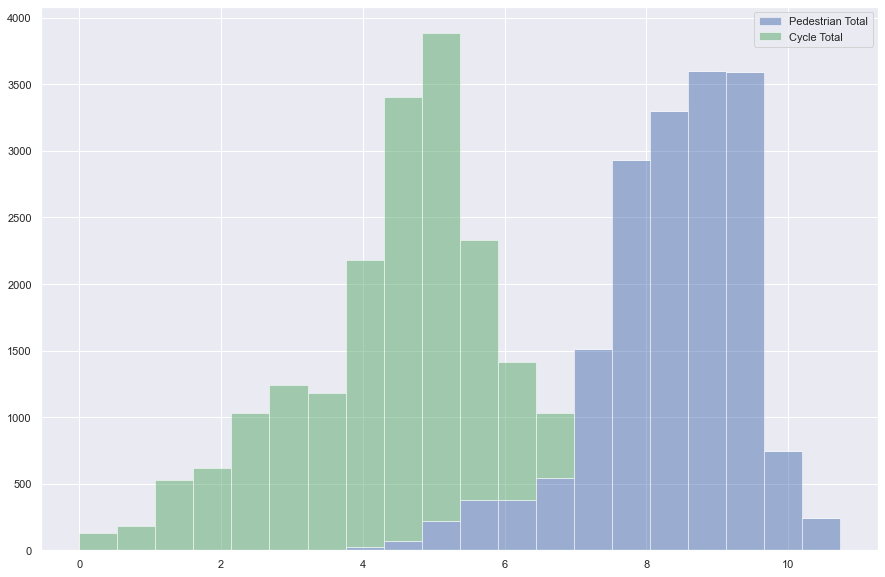

In [89]:
plt.figure(figsize=(15,10))
plt.hist((np.log(df[['Pedestrian Total','Cycle Total']]).replace([np.inf, -np.inf])), 
         label=['Pedestrian Total', 'Cycle Total'], color=['b','g'], stacked=True, bins=20, alpha=0.5)
plt.legend(loc=0)
plt.show()

In [ ]:
sns.pairplot(data=df[['Pedestrian Total','Cycle Total','temp','rain']]);

In [ ]:
sns.heatmap(df[['Pedestrian Total','Cycle Total','temp','rain']].corr(), annot=True);

In [ ]:
df.columns

## Sums of Data

In [ ]:
dfSums = df[['rain', 'temp', 'Day of Week', 'Hour', 'Season','Cycle Total','Pedestrian Total']]
dfSums

In [ ]:
from dataprep.eda import create_report
create_report(dfSums)

### Sums Daily

In [ ]:
dfSums.reset_index(inplace=True)
dfSumsDaily = dfSums.resample('D', on='date').agg({'rain':'sum', 'temp':'mean', 'Day of Week':'last', 'Hour':'last', 'Season':'last',
 'Cycle Total':'sum','Pedestrian Total':'sum'})
dfSumsDaily

In [ ]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total', 'Season']]

In [ ]:
sns.displot(data=dfSumsDaily[['Cycle Total', 'Pedestrian Total', 'Season']], 
            x="Pedestrian Total", col='Season', hue='Season');

### Daily Correlations

In [ ]:
sns.pairplot(data=dfSumsDaily);

### Daily Distributions

In [ ]:
#https://datagy.io/python-correlation-matrix/
mask = np.triu(np.ones_like(df.corr(), dtype=bool))
sns.heatmap(df.corr(), annot=True, vmax=1, vmin=-1, center=0, mask = mask, cmap='vlag')
plt.show();

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp');

In [ ]:
dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']].plot(kind='density', subplots=True, figsize=(10,15));

In [ ]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], orient='h', palette='Accent_r');

### Distribution Comparisons

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp')
plt.xticks(rotation=90)
plt.show();

In [ ]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp');

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain');

In [ ]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain');

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp',size='temp');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='temp', y='Cycle Total',size='Cycle Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain',size='rain');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='rain', y='Cycle Total',size='Cycle Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='temp', y='Pedestrian Total',size='Pedestrian Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp',size='temp');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain',size='rain');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='rain', y='Pedestrian Total',size='Pedestrian Total');

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=cycleCount, scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

In [ ]:
plt.hist(cycleCount.sum(axis=1), density=True, edgecolor='black');
#cycleCount.sum(axis=1).plot(kind='density', subplots=True, figsize=(10,15));

In [ ]:
plt.hist(cycleCount.mean(axis=1), density=True, edgecolor='black');

In [ ]:
np.log(cycleCount.sum(axis=1)).replace([np.inf, -np.inf])

In [ ]:
# Machine Learning for Time-Series with Python Forecast, predict and detect anamolies pg. 82
plt.hist(np.log(cycleCount.sum(axis=1)).replace([np.inf, -np.inf]), density=True, edgecolor='black');

In [ ]:
# Probability Distribution
# Foundations of Statistics for Data Scientists pg. 393
probplot(cycleCount.sum(axis=1),dist='norm',plot = pyplot);

In [ ]:
probplot(cycleCount.mean(axis=1),dist='norm',plot = pyplot);

In [ ]:
dfSumsDaily.describe()

### Line Plots of Daily Sums

In [ ]:
#https://scikit-learn.org/stable/auto_examples/applications/plot_cyclical_feature_engineering.html

fig, ax = plt.subplots(figsize=(12, 4))

avgWeekCycle = cycleCountEDA.groupby(['Day', 'hour']).mean()
avgWeekCycle.reset_index(inplace=True)
avgWeekCycle.drop(columns=['Day','hour'], inplace=True)
avgWeekCycle['Total'] = avgWeekCycle.sum(axis=1)
avgWeekCycle.Total.plot(ax=ax)

_ = ax.set(
    title="Average of hourly Cyclist Count During The Week",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel="Time of the week",
    ylabel="Cyclist Count Mean",)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show()

In [ ]:
plt.hist(pedCount[pedCols].sum(axis=1), density=True, edgecolor='black');
#cycleCount.sum(axis=1).plot(kind='density', subplots=True, figsize=(10,15));

In [ ]:
plt.hist(pedCount[pedCols].mean(axis=1), density=True, edgecolor='black');

In [ ]:
# Machine Learning for Time-Series with Python Forecast, predict and detect anamolies pg. 82
plt.hist(np.log(pedCount[pedCols].sum(axis=1)).replace([np.inf, -np.inf]), density=True, edgecolor='black');

In [ ]:
# Probability Distribution
# Foundations of Statistics for Data Scientists pg. 393
probplot(pedCount[pedCols].sum(axis=1),dist='norm',plot = pyplot);

In [ ]:
probplot(pedCount[pedCols].mean(axis=1),dist='norm',plot = pyplot);

In [ ]:
#https://scikit-learn.org/stable/auto_examples/applications/plot_cyclical_feature_engineering.html
fig, ax = plt.subplots(figsize=(12, 4))

avgWeekPed = pedCountEDA.groupby(['Day', 'hour']).mean()
avgWeekPed.reset_index(inplace=True)
avgWeekPed.drop(columns=['Day','hour'], inplace=True)
avgWeekPed['Total'] = avgWeekPed.sum(axis=1)
avgWeekPed.Total.plot(ax=ax)

_ = ax.set(
    title="Average of hourly Pedestrian Count During The Week",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel="Time of the week",
    ylabel="Pedestrian Count Mean",)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show()

In [ ]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].plot();

In [ ]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum().plot();

In [ ]:
np.log(dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum()).plot();

In [ ]:
df.info()

# Pre Process Data

In [89]:
#https://www.geeksforgeeks.org/how-to-replace-values-in-column-based-on-condition-in-pandas/
df['Day of Week'] = np.where(df['Day of Week'] <= 4, 'Week Day', 'Week End')
df2021['Day of Week'] = np.where(df2021['Day of Week'] <= 4, 'Week Day', 'Week End')
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,Week Day,0,1,26.00,4896.00,4922.00,NaN,NaN
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,Week Day,1,1,29.00,3154.00,3183.00,NaN,NaN
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,Week Day,2,1,22.00,3544.00,3566.00,NaN,NaN
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,Week Day,3,1,24.00,3336.00,3360.00,NaN,NaN
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,Week Day,4,1,17.00,1561.00,1578.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,Week Day,19,1,42.00,4694.00,4736.00,65.42,6893.50
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,Week Day,20,1,26.00,3499.00,3525.00,63.58,6955.08
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,Week Day,21,1,20.00,2704.00,2724.00,62.83,6937.33


In [90]:
df['Hour'] = np.where((df['Hour'] >= 7) & (df['Hour'] <= 19), 'Peak Time', 'Non Peak Time')
df2021['Hour'] = np.where((df2021['Hour'] >= 7) & (df2021['Hour'] <= 19), 'Peak Time', 'Non Peak Time')
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,Week Day,Non Peak Time,1,26.00,4896.00,4922.00,NaN,NaN
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,Week Day,Non Peak Time,1,29.00,3154.00,3183.00,NaN,NaN
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,Week Day,Non Peak Time,1,22.00,3544.00,3566.00,NaN,NaN
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,Week Day,Non Peak Time,1,24.00,3336.00,3360.00,NaN,NaN
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,Week Day,Non Peak Time,1,17.00,1561.00,1578.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,Week Day,Peak Time,1,42.00,4694.00,4736.00,65.42,6893.50
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,Week Day,Non Peak Time,1,26.00,3499.00,3525.00,63.58,6955.08
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,Week Day,Non Peak Time,1,20.00,2704.00,2724.00,62.83,6937.33


In [91]:
df.Season = df.Season.map({1:'Winter',2:'Spring', 3:'Summer', 4:'Autumn'})
df2021.Season = df2021.Season.map({1:'Winter',2:'Spring', 3:'Summer', 4:'Autumn'})
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Season,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,Week Day,Non Peak Time,Winter,26.00,4896.00,4922.00,NaN,NaN
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,Week Day,Non Peak Time,Winter,29.00,3154.00,3183.00,NaN,NaN
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,Week Day,Non Peak Time,Winter,22.00,3544.00,3566.00,NaN,NaN
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,Week Day,Non Peak Time,Winter,24.00,3336.00,3360.00,NaN,NaN
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,Week Day,Non Peak Time,Winter,17.00,1561.00,1578.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,Week Day,Peak Time,Winter,42.00,4694.00,4736.00,65.42,6893.50
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,Week Day,Non Peak Time,Winter,26.00,3499.00,3525.00,63.58,6955.08
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,Week Day,Non Peak Time,Winter,20.00,2704.00,2724.00,62.83,6937.33


# Machine Learning

## Data Prep Class

In [92]:
class dataPrep():
    def __init__(self, data, splitSize, scale, label):
        self.label = label
        self.data = data
        self.splitSize = splitSize
        self.scale = scale
        self.yData = self.data[self.label]
        self.XData = self.data
        
    def imputeData(self, impute):
        if impute == 'KNN':
            imputer = KNNImputer(n_neighbors=3)
            impute = imputer.fit_transform(self.data)
            df = pd.DataFrame(impute, columns=self.data.columns)
        elif impute == 'Pandas':
            df = self.data.fillna(method='bfill')
            if df.isnull().values.any():
                df = df.fillna(method='ffill')
        self.data = df
        self.XData = df
        return df
    
    def scaleData(self):
        scaler = StandardScaler()
        self.XData = self.data
        scaled = scaler.fit(self.XData)
        data_scaled = scaled.fit_transform(self.XData)
        self.XData = data_scaled
        return scaled
        
    def splitData(self):
        X_train, X_test, y_train, y_test = train_test_split(self.XData, self.yData, test_size= self.splitSize, shuffle=False)
        return X_train, X_test, y_train, y_test

## Machine Learning Model Class

In [ ]:
class mLModel():
    def __init__(self, params, cv, model, data, splitSize, 
                 inputScaler, label, imputer):
        self.params = params
        self.cv = cv
        self.imputer = imputer
        self.model = model
        self.data = data
        self.splitSize = splitSize
        self.scale = inputScaler
        self.label = label
        self.fittedModel = None
        self.bestParams = None
        
    def transformData(self):
        dataT = dataPrep(self.data, self.splitSize, self.scale, self.label)
        data = dataT.imputeData(self.imputer)
        self.data = data
        if self.scale == 'Standard':
            scaledData = dataT.scaleData()
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
        else:
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
    
    def createModel(self):
        if self.model == 'Ridge':
            model = RandomizedSearchCV(estimator=Ridge(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        if self.model == 'RandomForest':
            model = RandomizedSearchCV(estimator=RandomForestRegressor(), param_distributions=self.params, 
                            n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, 
                                return_train_score=True, refit=True)
        if self.model == 'KNN':
            model = RandomizedSearchCV(estimator=KNeighborsRegressor(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        return model
    
    def fitModel(self, model, X_train, y_train):
        fitMod = model.fit(X_train, y_train)
        self.bestParams = fitMod.best_params_
        self.fittedModel = fitMod
        self.score = fitMod.best_score_
        return fitMod
    
    def getMetrics(self, X_train, X_test, y_train, y_test, lossFunction):
        r2 = []
        mse = []
        mae = []
        predTrain = self.fittedModel.predict(X_train)
        predTest = self.fittedModel.predict(X_test)
        for loss in lossFunction:
            if loss == mean_squared_error:
                mse.append(mean_squared_error(y_train, predTrain))
                mse.append(mean_squared_error(y_test, predTest))
            elif loss == r2_score:
                r2.append(r2_score(y_train, predTrain))
                r2.append(r2_score(y_test, predTest))
            if loss == mean_absolute_error:
                mae.append(mean_absolute_error(y_train, predTrain))
                mae.append(mean_absolute_error(y_test, predTest))    
                
        results = pd.DataFrame()
        results['Data Set'] = ['Train','Test']
        results['Label'] = self.label
        results['Scaled'] = self.scale
        results['Imputer'] = self.imputer
        results['Split'] = self.splitSize
        results['MSE'] = mse
        results['MAE'] = mae
        results['R2'] = r2
        results['Model'] = self.model
        results['Best Params'] = str(self.bestParams)
        results['feature importance'] = 'Not Available'
        if self.model == 'RandomForest':
            results.at[0,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
            results.at[1,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
        return predTrain, predTest, results
    
    def visualizeResults(self, period, y_test, predTest):
        x_ax = range(len(y_test[:period]))
        plt.scatter(x_ax, y_test[:period], s=5, color="blue", label="original")
        plt.plot(x_ax, predTest[:period], lw=0.8, color="red", label="predicted")
        plt.legend()
        plt.show()

In [93]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures

In [94]:
dfTest = df.copy()


In [95]:
enc = OneHotEncoder()

In [96]:

#encoders = enc.fit_transform(dfTest[['Day of Week', 'Hour', 'Season']]).toarray()
encoders = enc.fit_transform(dfTest[['Day of Week', 'Hour']]).toarray()
dfTest.drop(columns=['Day of Week', 'Hour', 'Season'], inplace=True)

In [97]:
cols = ['Week Day', 'Week End', 'Non Peak', 'Peak']
#cols = ['Week Day', 'Week End', 'Non Peak', 'Peak', 'Autumn','Spring', 'Summer', 'Winter']
encoded = pd.DataFrame(encoders, columns=cols, index= dfTest.index)
encoded

,Week Day,Week End,Non Peak,Peak
date,,,,
2019-01-01 00:00:00,1.00,0.00,1.00,0.00
2019-01-01 01:00:00,1.00,0.00,1.00,0.00
2019-01-01 02:00:00,1.00,0.00,1.00,0.00
2019-01-01 03:00:00,1.00,0.00,1.00,0.00
2019-01-01 04:00:00,1.00,0.00,1.00,0.00
...,...,...,...,...
2020-12-31 19:00:00,1.00,0.00,0.00,1.00
2020-12-31 20:00:00,1.00,0.00,1.00,0.00
2020-12-31 21:00:00,1.00,0.00,1.00,0.00


In [98]:
dfTest = pd.concat([dfTest, encoded], axis=1)
dfTest

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Cycle Total,Pedestrian Total,Total,12 Hour Cycle Moving Average,12 Hour Pedestrian Moving Average,Week Day,Week End,Non Peak,Peak
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,26.00,4896.00,4922.00,NaN,NaN,1.00,0.00,1.00,0.00
2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,29.00,3154.00,3183.00,NaN,NaN,1.00,0.00,1.00,0.00
2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,22.00,3544.00,3566.00,NaN,NaN,1.00,0.00,1.00,0.00
2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,24.00,3336.00,3360.00,NaN,NaN,1.00,0.00,1.00,0.00
2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,17.00,1561.00,1578.00,NaN,NaN,1.00,0.00,1.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,42.00,4694.00,4736.00,65.42,6893.50,1.00,0.00,0.00,1.00
2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,26.00,3499.00,3525.00,63.58,6955.08,1.00,0.00,1.00,0.00
2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,20.00,2704.00,2724.00,62.83,6937.33,1.00,0.00,1.00,0.00


In [99]:
dataT = dataPrep(dfTest, 0.30, 'Standard', 'Pedestrian Total')
dataT.scaleData()
data = dataT.imputeData('KNN')

In [100]:
X_train, X_test, y_train, y_test = dataT.splitData()

In [101]:
rf = RandomForestRegressor(n_estimators=1000)
rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=1000)

In [102]:
rg1 = Ridge()
rg1.fit(X_train, y_train)

Ridge()

In [103]:
poly_transformer = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
timeData = poly_transformer.fit_transform(X_train[cols])
rg2 = Ridge()
rg2.fit(timeData, y_train)

Ridge()

In [209]:
y_pred = rf.predict(X_train)
r2_score(y_train, y_pred)

0.9999984065075448

In [212]:
y_pred = rf.predict(X_test)
r2_score(y_test, y_pred)

0.999999773790195

In [214]:
y_pred = rg1.predict(X_train)
r2_score(y_train, y_pred)

1.0

In [215]:
y_pred = rg1.predict(X_test)
r2_score(y_test, y_pred)

0.9999999999999991

In [217]:
y_pred = rg2.predict(timeData)
r2_score(y_train, y_pred)

0.2628577970579108

In [109]:
timeDataTest = poly_transformer.fit_transform(X_test[cols])

In [219]:
y_pred = rg2.predict(timeDataTest)
r2_score(y_test, y_pred)

-0.3179521129490037

In [220]:
mean_squared_error(y_test, y_pred)

15958635.812701033

In [207]:
mean_absolute_error(y_test, y_pred)

3297.1408493191275

In [208]:
r2_score(y_test, y_pred)

-0.3179521129490037

Text(0, 0.5, 'Feature')

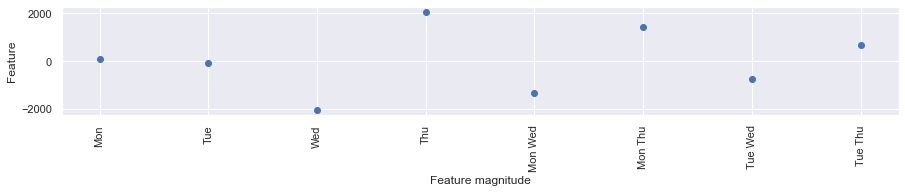

In [221]:
hour = ["%02d:00" % i for i in range(0, 24, 3)]
day = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
features = day + hour

features_poly = poly_transformer.get_feature_names(features)
features_nonzero = np.array(features_poly)[rg2.coef_ != 0]
coef_nonzero = rg2.coef_[rg2.coef_ != 0]

plt.figure(figsize=(15, 2))
plt.plot(coef_nonzero, 'o')
plt.xticks(np.arange(len(coef_nonzero)), features_nonzero, rotation=90)
plt.xlabel("Feature magnitude")
plt.ylabel("Feature")

Text(0, 0.5, 'Rentals')

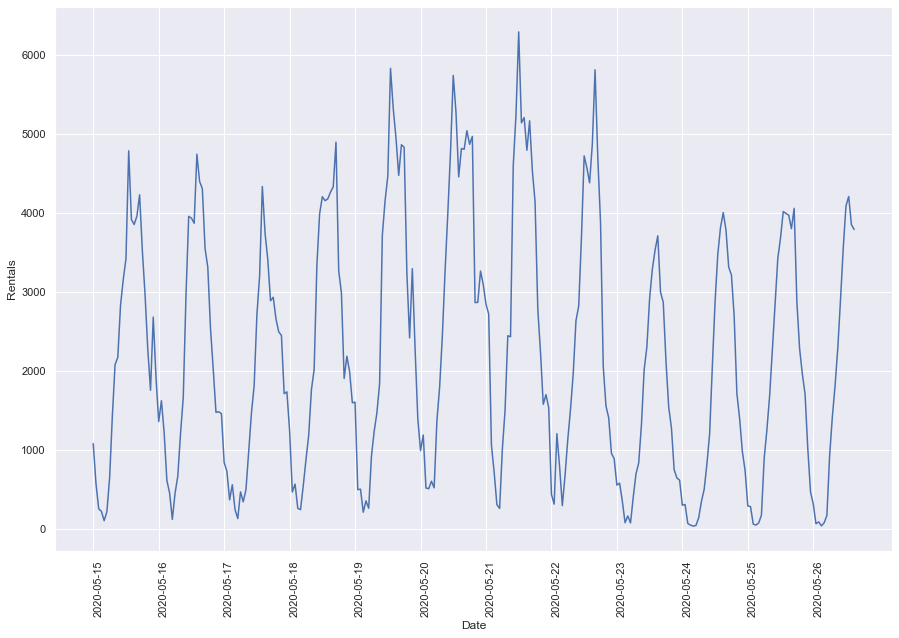

In [195]:
tim = 500
val = X_train
val.index = dfTest.index[:len(val)]
plotData = val['Pedestrian Total'][tim*24:]

xticks = pd.date_range(start=plotData.index.min(), end=plotData.index.max(),
freq='D')
plt.xticks(xticks, xticks.strftime("%Y-%m-%d"), rotation=90, ha="left")
plt.plot(plotData)
plt.xlabel("Date")
plt.ylabel("Rentals")

ValueError: x and y must have same first dimension, but have shapes (12280, 42) and (5264,)

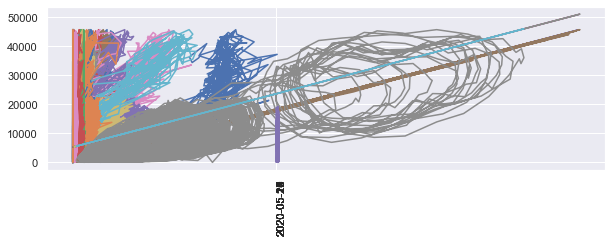

In [202]:
plt.figure(figsize=(10,3))

plt.xticks(xticks, xticks.strftime("%Y-%m-%d"), rotation=90, ha="left")

plt.plot(X_train, y_train, label = "train")
plt.plot(X_train, len(y_test) + X_train, y_test, '-', label = "test")
plt.plot(X_train, y_pred, '--', label = "prediction train")

plt.plot(X_train, y_test + X_train, y_pred, '--', label = "prediction test")
plt.legend(loc = (1.01, 0))
plt.xlabel("Date")
plt.ylabel("Henry street footfall counts")

## Loss Functions

In [ ]:
lossFunction = [mean_squared_error, mean_absolute_error, r2_score] 
totalResults = pd.DataFrame()

## Model Parameters

In [ ]:
# Random Forest Model Parameters
rfParams = {'bootstrap': [True, False], 
          'max_depth': [10, 20, 100], 
          'max_features': ['sqrt', 'log2'], 
          'n_estimators': [10, 50, 100, 500, 1000, 2000]}

# Ridge Model Parameters
ridgeParams = {'alpha': [0.001, 0.01, 0.1, 1, 5, 10], 
          'normalize': [True, False]}

# Lasso Model Parameters
knnParams = {'n_neighbors': [2, 3, 5, 7, 10], 
          'leaf_size': [20, 30, 40, 50],
              'p': [1, 2]}

## Create and Fit Models

In [ ]:
count = 1
total = len(predict) * len(scalers) * len(imputers) * len(models) * len(splitSizes)
for mod in models:
    for pre in predict:
        for sca in scalers:
            for spl in splitSizes:
                for imp in imputers:
                    data = df.copy()
                    valData = df2021.copy()
                    if mod == 'KNN':
                        p = knnParams
                    elif mod == 'Ridge':
                        p = ridgeParams
                    elif mod == 'RandomForest':
                        p = rfParams
                    if pre == 'Cycle Total':
                        data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                        valData.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                    elif pre == 'Pedestrian Total':
                        data.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                        valData.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                    
                    # Create machine learning class
                    randomSearch = mLModel(params=p, cv=5, model=mod,
                                                       data=data, splitSize=spl, inputScaler=sca, 
                                                label=pre, imputer=imp)
                    # Split the dataset
                    X_train, X_test, y_train, y_test = randomSearch.transformData()
                    
                    # Create the model 
                    model = randomSearch.createModel()

                    # Fit the model and test 
                    randomSearch.fitModel(model, X_train, y_train)
                    
                    # Get metrics
                    predTrain, predTest, results = randomSearch.getMetrics(X_train, X_test, y_train,
                                                                y_test, lossFunction)
                    
                    dataX = dataPrep(valData, spl, sca, pre)
                    dataX.imputeData(imp)
                    dataX.scaleData()
                    
                    pred2021 = randomSearch.fittedModel.predict(dataX.XData)
                    
                    y = valData[[pre]]
                    results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, 
                                                       mean_squared_error(y, pred2021),
                        mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
                    totalResults = pd.concat([totalResults, results], axis=0)
                    
                    print('Completed {}%'.format(round((count / total)*100,2)))
                    count += 1

# All Results

In [ ]:
totalResults[(totalResults.R2 > 0.7) & (totalResults['Data Set'] == 'Validation Data')]

In [ ]:
totalResults.to_csv('TotalResults242022.csv', index=False)

dataVal = df2021.copy()
dataX = dataPrep(dataVal, spl, sca, pre)
dataX.imputeData(imp)

dataX.data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                   'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
          axis=1, inplace=True)

dataX.scaleData()

y = dataVal[[pre]]

pred2021 = randomSearch.fittedModel.predict(dataX.XData)

r2_score(y, pred2021)

results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, mean_squared_error(y, pred2021),
    mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
results

results = pd.read_csv('TotalResults2632022.csv')
results

In [ ]:
#results2 = pd.read_csv('TotalResults2732022.csv') 
#results2
